### Time Series Forecasting Capstone Project


### Problem Statement:

Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks. 

As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - 1,3,8,9,13,25,29,31 and 46.

Importing the libraries

In [232]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy as sp


from matplotlib.pyplot import rcParams
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen 
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import timedelta

# Suppressing warnings for cleaner output.
import warnings
warnings.filterwarnings('ignore')

# Setting pandas options to display all columns and rows in DataFrames.
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Reading the Dataset

In [233]:
train_df = pd.read_csv('D:/Dataset/train.csv')
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [234]:
# Displaying the shape of the train_df dataframe, which shows the number of rows and columns
train_df.shape

(1017209, 9)

In [235]:
# Converting the column names of the train_df dataframe to a list using the to_list() method
train_df.columns.to_list()

['Store',
 'DayOfWeek',
 'Date',
 'Sales',
 'Customers',
 'Open',
 'Promo',
 'StateHoliday',
 'SchoolHoliday']

In [236]:
# Checking for missing values in the train_df dataframe using the isnull()
train_df.isnull().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [237]:
store_df = pd.read_csv('D:/Dataset/store.csv')
store_df.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [238]:
# Displaying the shape of the store_df dataframe
store_df.shape

(1115, 10)

In [239]:
# Converting the column names of the store_df dataframe to a list using the to_list() method
store_df.columns.to_list()

['Store',
 'StoreType',
 'Assortment',
 'CompetitionDistance',
 'CompetitionOpenSinceMonth',
 'CompetitionOpenSinceYear',
 'Promo2',
 'Promo2SinceWeek',
 'Promo2SinceYear',
 'PromoInterval']

In [240]:
# Checking for missing values in the store_df dataframe using the isnull()
store_df.isnull().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64

In [241]:
# Merging two DataFrames, `train_df` and `store_df`, on the column 'Store' using an inner join.
# The inner join will include only the rows that have matching values in the 'Store' column of both DataFrames.
df = pd.merge(train_df, store_df, how='inner', on='Store')

In [242]:
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [243]:
# Converting the column names of the df dataframe to a list using the to_list() method
df.columns.to_list()

['Store',
 'DayOfWeek',
 'Date',
 'Sales',
 'Customers',
 'Open',
 'Promo',
 'StateHoliday',
 'SchoolHoliday',
 'StoreType',
 'Assortment',
 'CompetitionDistance',
 'CompetitionOpenSinceMonth',
 'CompetitionOpenSinceYear',
 'Promo2',
 'Promo2SinceWeek',
 'Promo2SinceYear',
 'PromoInterval']

In [244]:
# Generating descriptive statistics of the DataFrame df and transposing the result using .T
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,1017209.0,558.429727,321.908651,1.0,280.0,558.0,838.0,1115.0
DayOfWeek,1017209.0,3.998341,1.997391,1.0,2.0,4.0,6.0,7.0
Sales,1017209.0,5773.818972,3849.926175,0.0,3727.0,5744.0,7856.0,41551.0
Customers,1017209.0,633.145946,464.411734,0.0,405.0,609.0,837.0,7388.0
Open,1017209.0,0.830107,0.375539,0.0,1.0,1.0,1.0,1.0
Promo,1017209.0,0.381515,0.485759,0.0,0.0,0.0,1.0,1.0
SchoolHoliday,1017209.0,0.178647,0.383056,0.0,0.0,0.0,0.0,1.0
CompetitionDistance,1014567.0,5430.085652,7715.323700,20.0,710.0,2330.0,6890.0,75860.0
CompetitionOpenSinceMonth,693861.0,7.222866,3.211832,1.0,4.0,8.0,10.0,12.0
CompetitionOpenSinceYear,693861.0,2008.690228,5.992644,1900.0,2006.0,2010.0,2013.0,2015.0


In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 18 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   Store                      1017209 non-null  int64  
 1   DayOfWeek                  1017209 non-null  int64  
 2   Date                       1017209 non-null  object 
 3   Sales                      1017209 non-null  int64  
 4   Customers                  1017209 non-null  int64  
 5   Open                       1017209 non-null  int64  
 6   Promo                      1017209 non-null  int64  
 7   StateHoliday               1017209 non-null  object 
 8   SchoolHoliday              1017209 non-null  int64  
 9   StoreType                  1017209 non-null  object 
 10  Assortment                 1017209 non-null  object 
 11  CompetitionDistance        1014567 non-null  float64
 12  CompetitionOpenSinceMonth  693861 non-null   float64
 13  CompetitionO

In [246]:
# Calculating the percentage of missing values for each column in the DataFrame `df`.
# `df.isnull().sum()` returns the number of missing values in each column.
# Rounding the result to 2 decimal places for readability.
round(df.isnull().sum() * 100 / df.shape[0], 2)

Store                         0.00
DayOfWeek                     0.00
Date                          0.00
Sales                         0.00
Customers                     0.00
Open                          0.00
Promo                         0.00
StateHoliday                  0.00
SchoolHoliday                 0.00
StoreType                     0.00
Assortment                    0.00
CompetitionDistance           0.26
CompetitionOpenSinceMonth    31.79
CompetitionOpenSinceYear     31.79
Promo2                        0.00
Promo2SinceWeek              49.94
Promo2SinceYear              49.94
PromoInterval                49.94
dtype: float64

In [247]:
df['Promo2SinceWeek'].head(10)

0     NaN
1    13.0
2    14.0
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
Name: Promo2SinceWeek, dtype: float64

In [248]:
df['Promo2SinceWeek'].fillna(0, inplace=True)

In [249]:
df['Promo2SinceYear'].head(10)

0       NaN
1    2010.0
2    2011.0
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
Name: Promo2SinceYear, dtype: float64

In [250]:
df['Promo2SinceYear'].fillna(0, inplace=True)

In [251]:
df['PromoInterval'].head(10)

0                NaN
1    Jan,Apr,Jul,Oct
2    Jan,Apr,Jul,Oct
3                NaN
4                NaN
5                NaN
6                NaN
7                NaN
8                NaN
9                NaN
Name: PromoInterval, dtype: object

In [252]:
df['PromoInterval'].fillna(0, inplace=True)

In [253]:
round(df.isnull().sum()*100/df.shape[0],2)

Store                         0.00
DayOfWeek                     0.00
Date                          0.00
Sales                         0.00
Customers                     0.00
Open                          0.00
Promo                         0.00
StateHoliday                  0.00
SchoolHoliday                 0.00
StoreType                     0.00
Assortment                    0.00
CompetitionDistance           0.26
CompetitionOpenSinceMonth    31.79
CompetitionOpenSinceYear     31.79
Promo2                        0.00
Promo2SinceWeek               0.00
Promo2SinceYear               0.00
PromoInterval                 0.00
dtype: float64

In [254]:
df.head(10)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0
5,6,5,2015-07-31,5651,589,1,1,0,1,a,a,310.0,12.0,2013.0,0,0.0,0.0,0
6,7,5,2015-07-31,15344,1414,1,1,0,1,a,c,24000.0,4.0,2013.0,0,0.0,0.0,0
7,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0,0.0,0.0,0
8,9,5,2015-07-31,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0,0,0.0,0.0,0
9,10,5,2015-07-31,7185,681,1,1,0,1,a,a,3160.0,9.0,2009.0,0,0.0,0.0,0


In [255]:
# As you can see from the above, the 'CompetitionOpenSinceYear' and 'CompetitionOpenSinceMonth'
# columns with null values can be imputed with zero, since there is no data available for competition store openings.
df.CompetitionOpenSinceYear.fillna(0,inplace=True)
df.CompetitionOpenSinceMonth.fillna(0,inplace=True)

In [256]:
# the scope has been kept to nine key stores across Europe.
# The stores are key for the company keeping in mind the revenue and historical prestige associated with them.
# These stores are numbered - 1,3,8,9,13,25,29,31 and 46.

key_stores = [1,3,8,9,13,25,29,31,46]
filtered_df = df[df['Store'].apply(lambda x: x in key_stores)]
print(filtered_df.shape)

(8110, 18)


In [257]:
# Converting the 'Date' column in the DataFrame `filtered_df` to datetime format.
# This is useful for time series analysis and operations that require date manipulation.
filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])

In [258]:
# Extracting the year from the 'Date' column of the filtered_df DataFrame and storing it in a new column 'Year'
filtered_df['Year'] = filtered_df.Date.dt.year

# Extracting the month from the 'Date' column of the filtered_df DataFrame and storing it in a new column 'Month'
filtered_df['Month'] = filtered_df.Date.dt.month

# Extracting the day from the 'Date' column of the filtered_df DataFrame and storing it in a new column 'Day'
filtered_df['Day'] = filtered_df.Date.dt.day

In [259]:
# Displaying the first 10 rows of specific columns 'StoreType', 'Assortment', and 'StateHoliday'
# from the filtered_df DataFrame using double square brackets [[]]

filtered_df[['StoreType', 'Assortment', 'StateHoliday']].head(10)

,StoreType,Assortment,StateHoliday
0,c,a,0
2,a,a,0
7,a,a,0
8,a,c,0
12,d,a,0
24,c,a,0
28,d,c,0
30,d,c,0
45,c,a,0
1115,c,a,0


In [260]:
# Assortment - describes an assortment level: a = basic, b = extra, c = extended
# differentiates between 4 different store models: a, b, c, d
# StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays.
# Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None

def map_values_in_df(filtered_df, cols, value_map):
    filtered_df[cols] = filtered_df[cols].applymap(value_map.get)
    return filtered_df

columns_to_replace = ['StoreType', 'Assortment', 'StateHoliday']
map_values = {'0':0, 'a':1, 'b':2, 'c':3, 'd':4}

filtered_df = map_values_in_df(filtered_df, columns_to_replace, map_values)
filtered_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Year,Month,Day
0,1,5,2015-07-31,5263,555,1,1,0.0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,31
2,3,5,2015-07-31,8314,821,1,1,0.0,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",2015,7,31
7,8,5,2015-07-31,8492,833,1,1,0.0,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,2015,7,31
8,9,5,2015-07-31,8565,687,1,1,0.0,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,2015,7,31
12,13,5,2015-07-31,8821,568,1,1,0.0,0,4,1,310.0,0.0,0.0,1,45.0,2009.0,"Feb,May,Aug,Nov",2015,7,31


In [261]:
# Function definition to create dummy variables for a categorical column with multiple values separated by commas
def PromoInterval_dummy(filtered_df, column_name):
    # Create dummy variables for each value in the specified column, separated by commas
    dummies = filtered_df[column_name].astype(str).str.get_dummies(sep=',').add_prefix(column_name + '_')
    # Concatenate the dummy variables with the original DataFrame along the columns axis
    filtered_df = pd.concat([filtered_df, dummies], axis=1)
    # Drop the original column from the DataFrame as it's no longer needed after creating dummy variables
    filtered_df = filtered_df.drop(column_name, axis=1)
    # Return the modified DataFrame with dummy variables
    return filtered_df

# Applying the PromoInterval_dummy function to create dummy variables for the 'PromoInterval' column in filtered_df
filtered_df = PromoInterval_dummy(filtered_df, 'PromoInterval')

In [262]:
# Creating dummy variable for day of the week 

filtered_df = filtered_df.join(pd.get_dummies(filtered_df['DayOfWeek'], drop_first=True, prefix='DayOfWeek'))

In [263]:
filtered_df.shape

(8110, 35)

In [264]:
# List of month abbreviations used in the 'Promo2' interval
months = ['0', 'Apr', 'Aug', 'Feb', 'Jan', 'Jul', 'May', 'Nov', 'Oct']

# Generating column names for dummy variables corresponding to each month in the 'Promo2' interval
promo2_column = ['PromoInterval_' + month for month in months]


In [265]:
# creating few more variables

filtered_df['Sales/Customer'] = filtered_df['Sales']/filtered_df['Customers']
filtered_df['Sales/Customer'].describe()

count    6679.000000
mean        9.520721
std         2.003043
min         5.706169
25%         7.912390
50%         9.305882
75%        10.873640
max        24.901205
Name: Sales/Customer, dtype: float64

In [266]:
# Function definition to process the DataFrame by removing rows where the 'Open' column is equal to 0,
# and then dropping the 'Open' column from the DataFrame
def process_dataframe(filtered_df):
    return filtered_df[filtered_df['Open'] != 0].drop('Open', axis=1)

# Applying the process_dataframe function to the filtered_df DataFrame
filtered_df = process_dataframe(filtered_df)

# Printing the shape of the DataFrame to show the number of rows and columns after processing
print(filtered_df.shape)


(6681, 35)


In [267]:
# Filtering the DataFrame to include only rows where the 'Sales' column is not equal to 0
filtered_df = filtered_df.query('Sales != 0')

# Printing the shape of the filtered DataFrame to show the number of rows and columns after filtering
print(filtered_df.shape)

(6679, 35)


In [268]:
# Filtering the DataFrame to include only rows where the 'Sales' column is not equal to 0
filtered_df = filtered_df.loc[filtered_df['Sales'] != 0]

In [269]:
filtered_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,Sales/Customer
0,1,5,2015-07-31,5263,555,1,0.0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,7,31,1,0,0,0,0,0,0,0,0,False,False,False,True,False,False,9.482883
2,3,5,2015-07-31,8314,821,1,0.0,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,2015,7,31,0,1,0,0,1,1,0,0,1,False,False,False,True,False,False,10.126675
7,8,5,2015-07-31,8492,833,1,0.0,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,2015,7,31,1,0,0,0,0,0,0,0,0,False,False,False,True,False,False,10.194478
8,9,5,2015-07-31,8565,687,1,0.0,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,2015,7,31,1,0,0,0,0,0,0,0,0,False,False,False,True,False,False,12.467249
12,13,5,2015-07-31,8821,568,1,0.0,0,4,1,310.0,0.0,0.0,1,45.0,2009.0,2015,7,31,0,0,1,1,0,0,1,1,0,False,False,False,True,False,False,15.529930


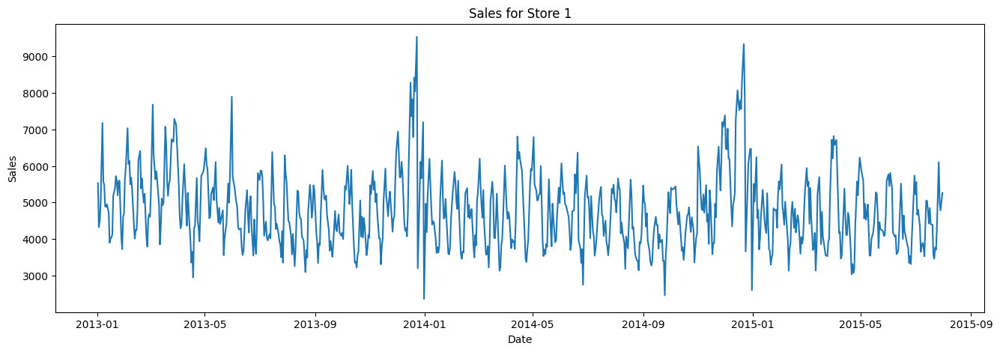

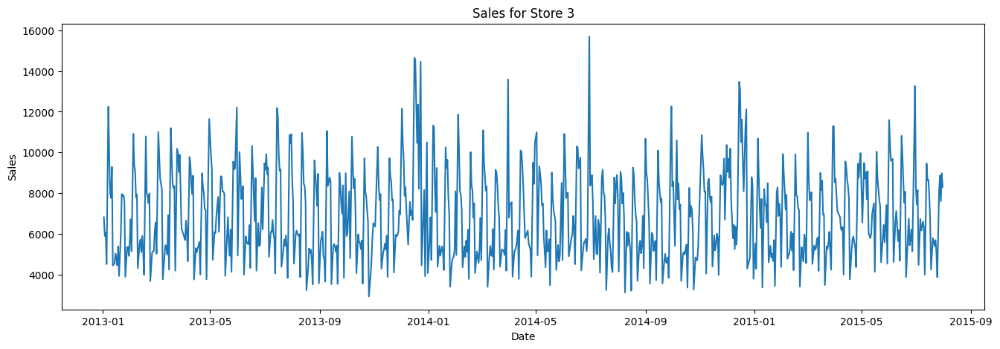

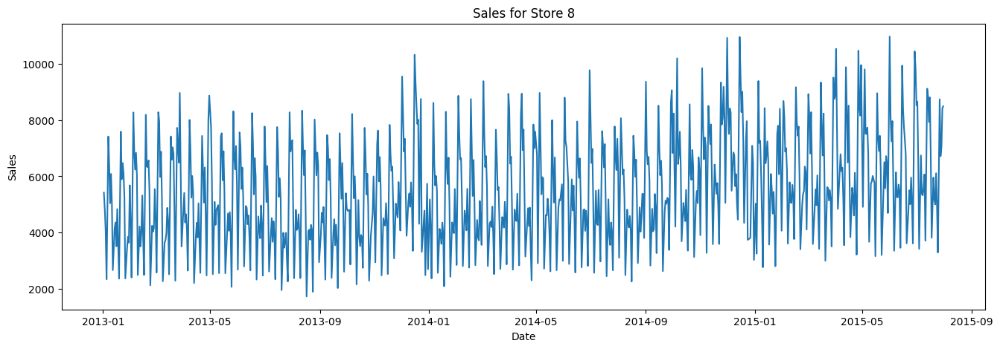

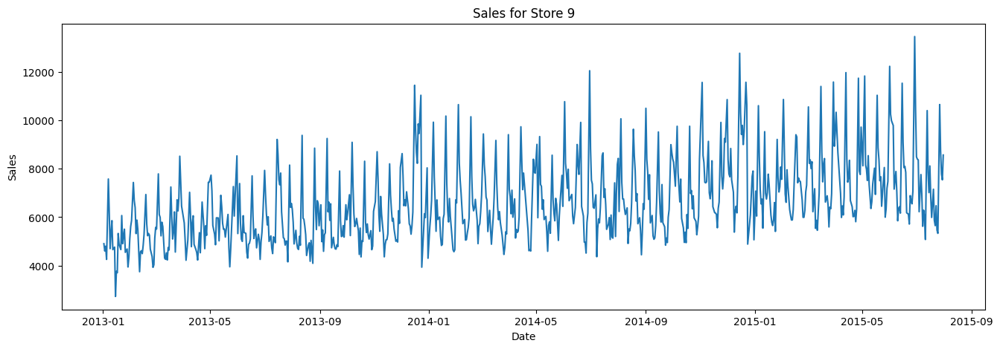

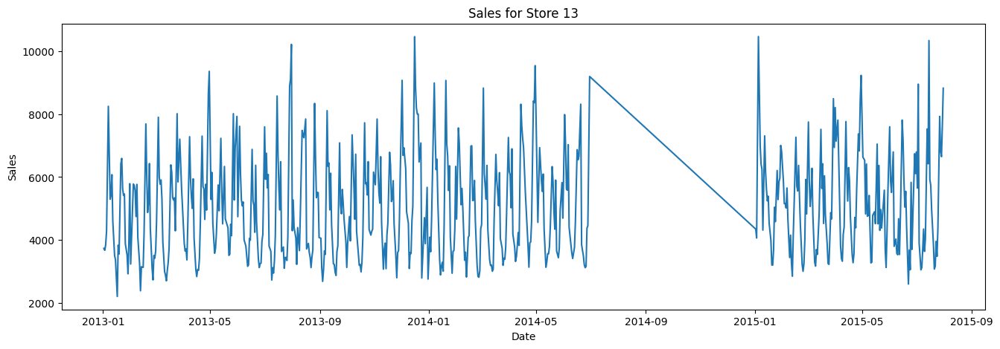

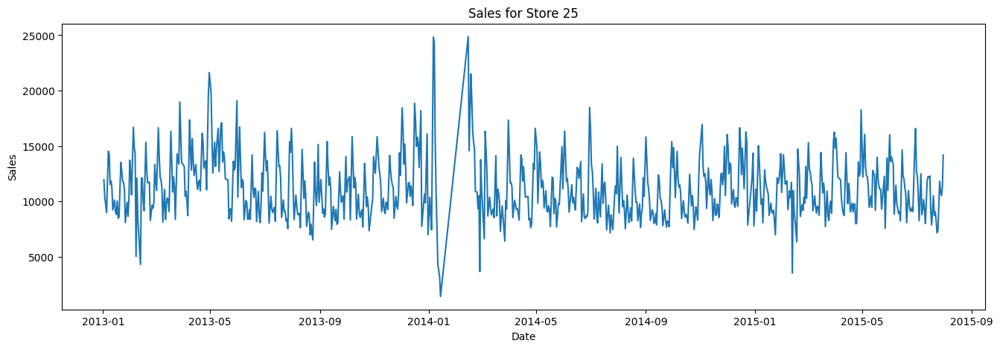

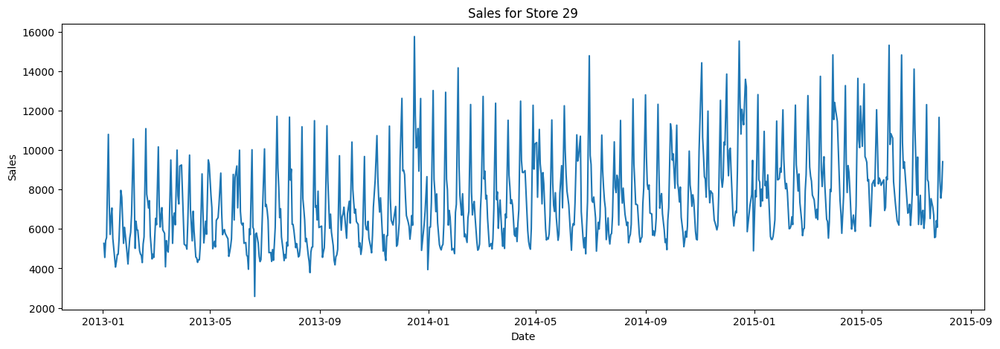

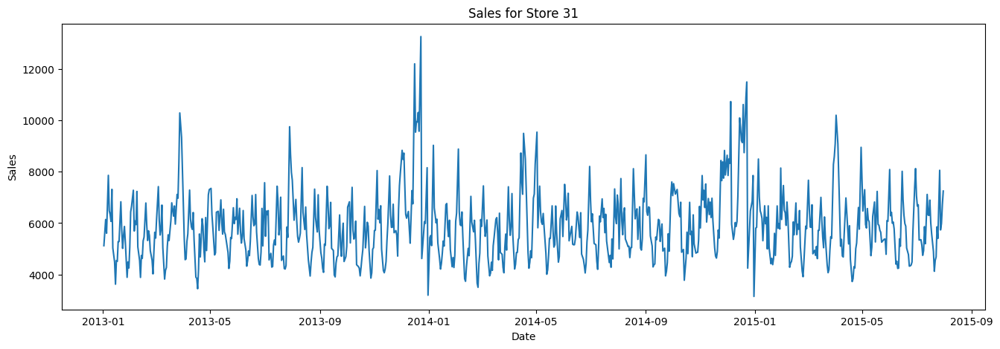

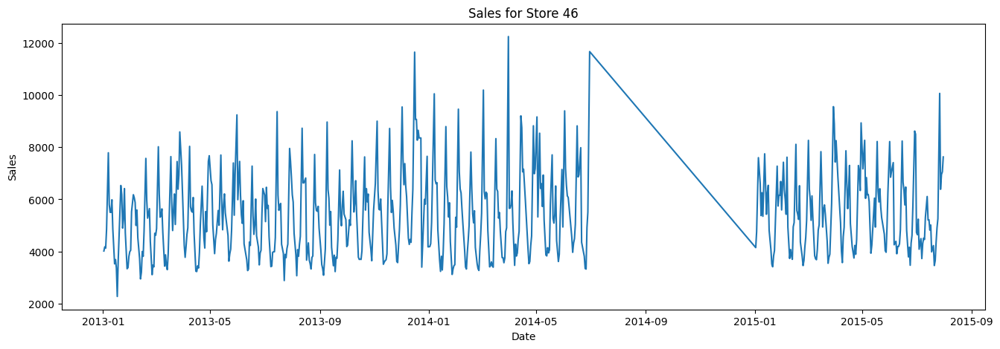

In [270]:
# Function definition to plot sales data for specific stores over time
def plot_sales_for_stores(filtered_df, key_stores):
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Extract data for the current store from the filtered DataFrame
        store_df = filtered_df[filtered_df.Store == store]
        # Create a new figure with specified size
        plt.figure(figsize=(16, 5))
        # Plot a line graph of sales over time for the current store
        sns.lineplot(data=store_df, x="Date", y='Sales')
        # Set title for the plot indicating the store number
        plt.title('Sales for Store ' + str(store))
        # Display the plot
        plt.show()

# Call the function to plot sales for the specified key stores
plot_sales_for_stores(filtered_df, key_stores)

In [271]:
# Dictionary comprehension to create a dictionary 'storedata' where each key is a store number
# and each value is a DataFrame containing sales data for that store, indexed by the 'Date' column
storedata = {store: filtered_df[filtered_df.Store == store].set_index(['Date']) for store in key_stores}

In [272]:
# Function definition to fill missing dates in a DataFrame and ensure a daily frequency
def fill_dates(dataframe):
    return dataframe.set_index(pd.DatetimeIndex(dataframe.index)).asfreq('D', fill_value=np.nan)

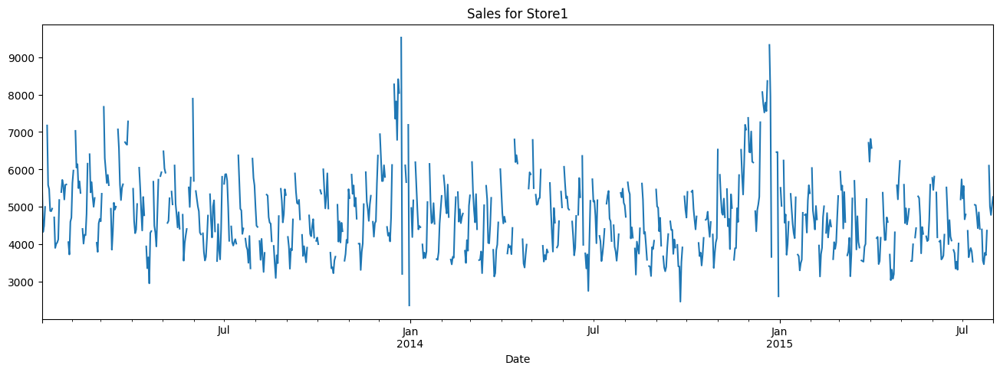

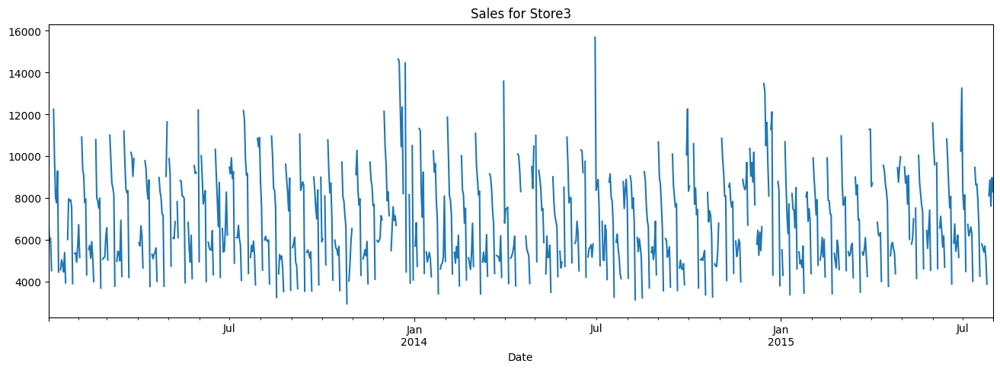

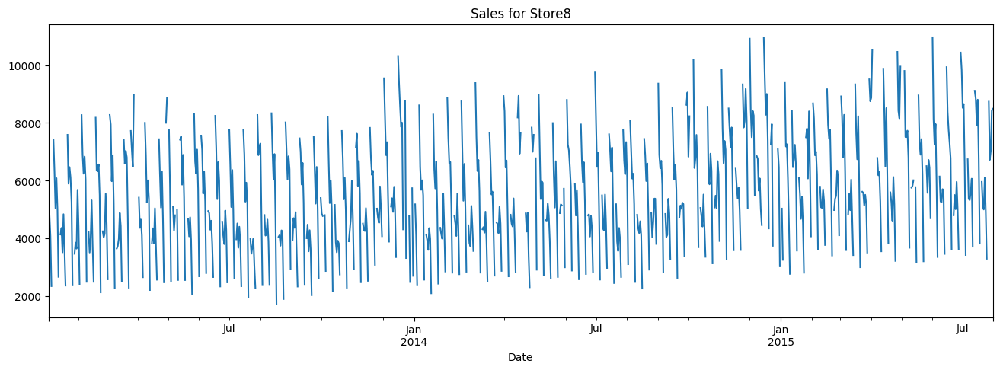

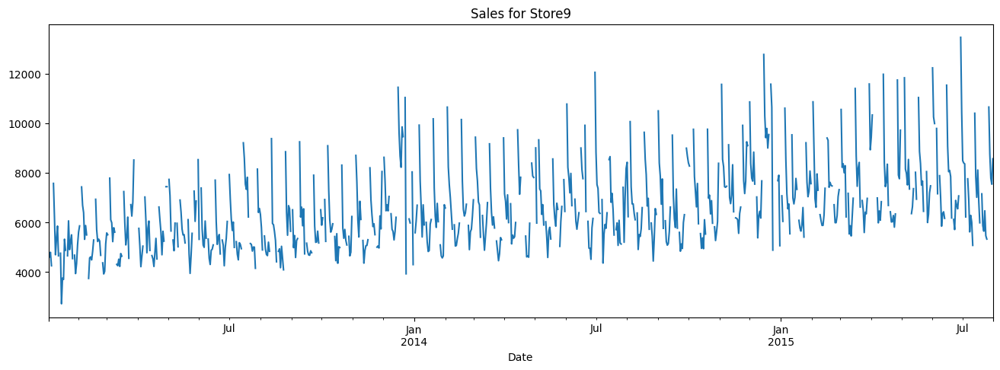

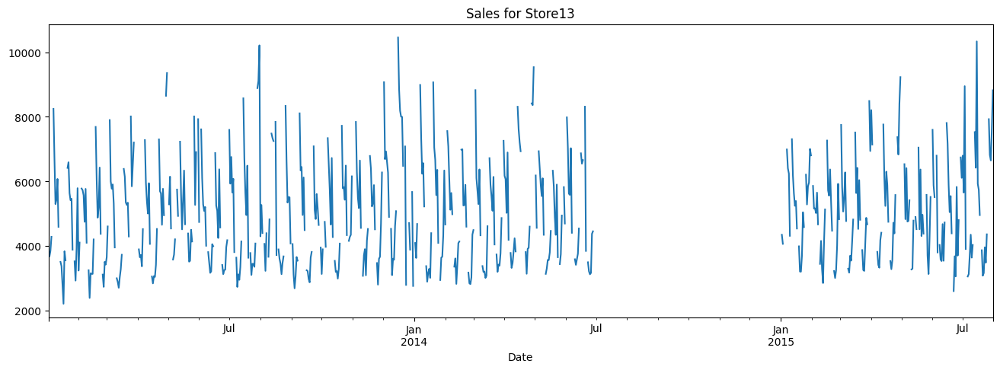

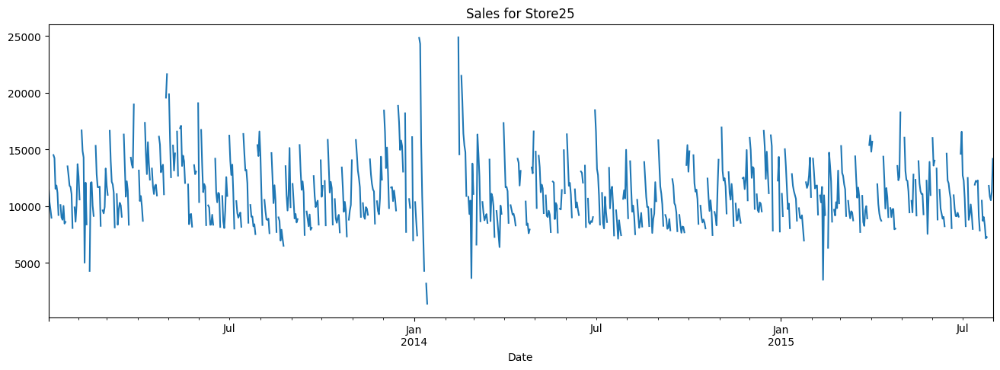

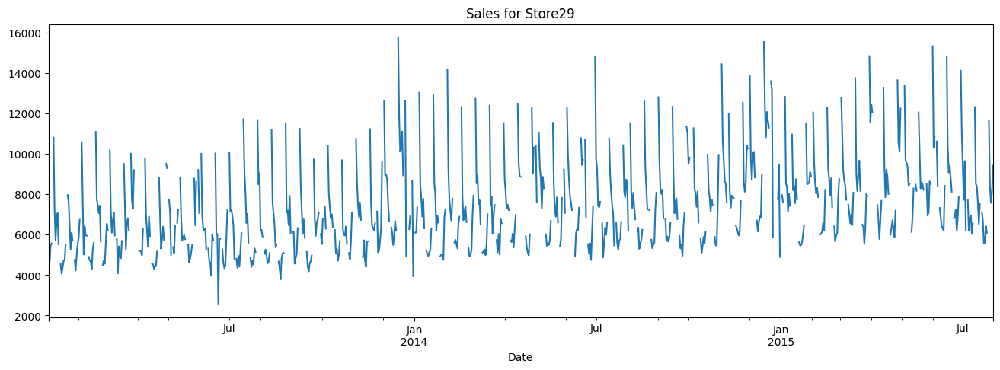

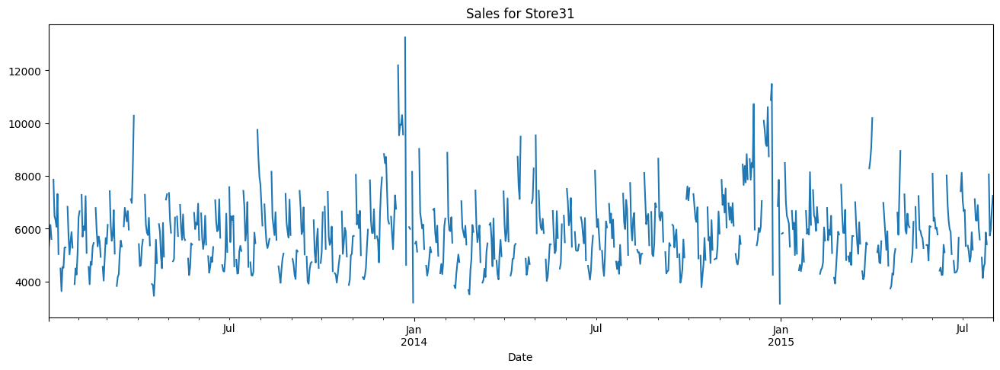

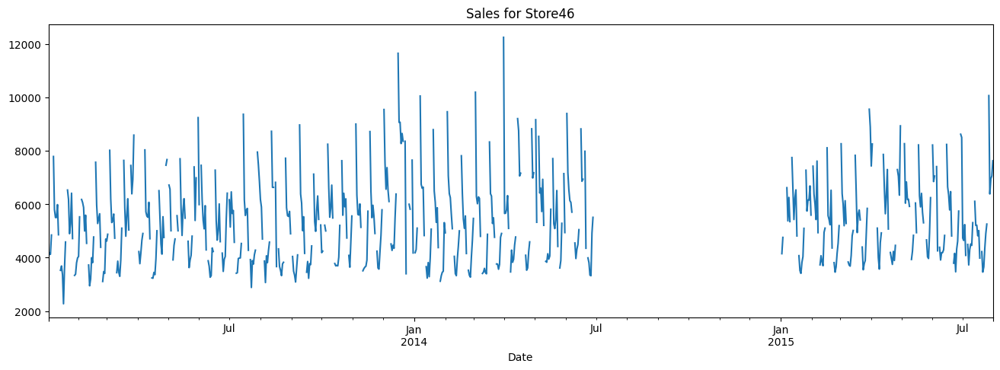

In [273]:
# Function definition to plot sales data for each store in the storedata dictionary
def plot_store_sales(storedata, key_stores, fill_dates):
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Fill missing dates for the current store's sales data using the fill_dates function
        storedata[store] = fill_dates(storedata[store])
        # Replace string "NaN" with actual NaN values in specified columns
        for column in ['Sales', 'Customers', 'Sales/Customer']:
            storedata[store][column].replace("NaN", np.nan, inplace=True)
        # Plot the 'Sales' column for the current store
        storedata[store]['Sales'].astype(float).plot(y='Sales', figsize=(16, 5))
        # Set title for the plot indicating the store number
        plt.title('Sales for Store' + str(store))
        # Display the plot without blocking further code execution
        plt.show(block=False)

# Call the function
plot_store_sales(storedata, key_stores, fill_dates)


In [274]:
# Importing the relativedelta class from the dateutil.relativedelta module
from dateutil.relativedelta import relativedelta

# Function definition to impute missing data in a specified column for a given store within a date range
def impute_missing_data(data, startdate, enddate, store, column):
    # Creating a boolean mask to identify rows with missing values in the specified column
    mask = (data.index > startdate) & (data.index < enddate) & pd.isna(data[column])
    # Extracting the index dates where missing values occur
    missing_dates = data.loc[mask].index
    # Iterating through each missing date
    for date in missing_dates:
        # Calculating the date one year prior to the missing date
        previous_year_date = date - relativedelta(years=1)
        # Imputing the missing value with the corresponding value from the previous year
        data.loc[date, column] = data.loc[previous_year_date.strftime("%Y-%m-%d"), column]

# List of stores and columns for which missing data will be imputed
stores = [13, 46]
columns = ['Sales', 'Customers']

# Iterating through each store and column combination
for store in stores:
    for column in columns:
        # Imputing missing data for the specified store and column within the given date range
        impute_missing_data(storedata[store], '2014-07-01', '2015-01-02', store, column)

# Selecting a specific date range for Store 46 after imputing missing data
Store_Data_46_filtered = storedata[46].loc['2014-07-16':'2015-01-01']

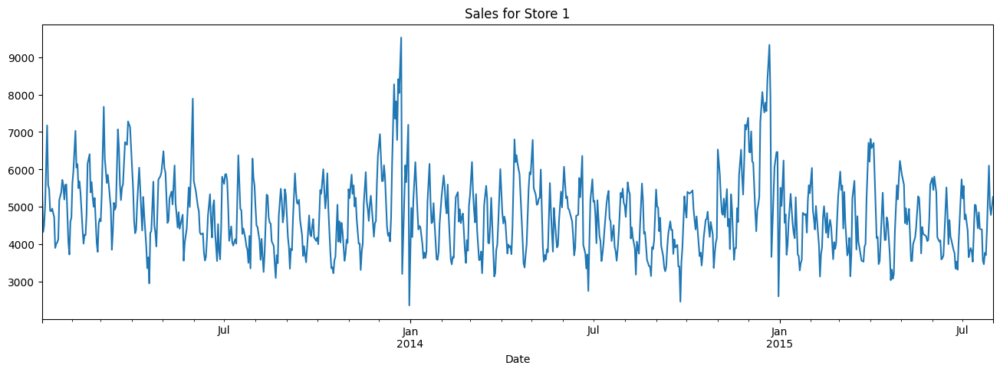

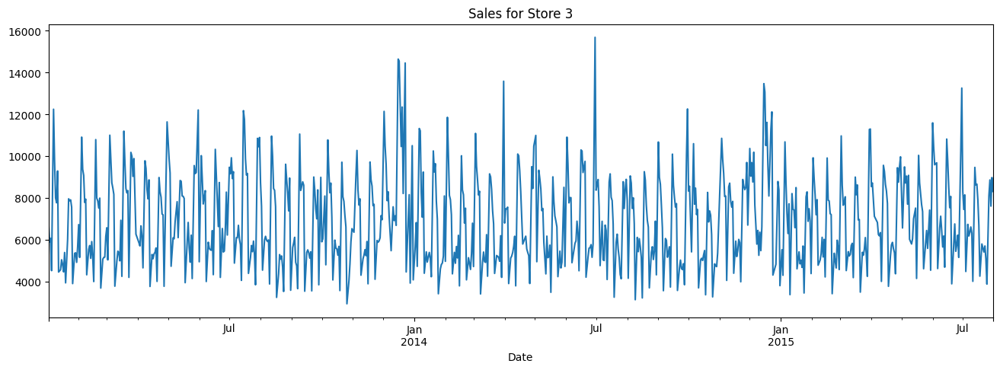

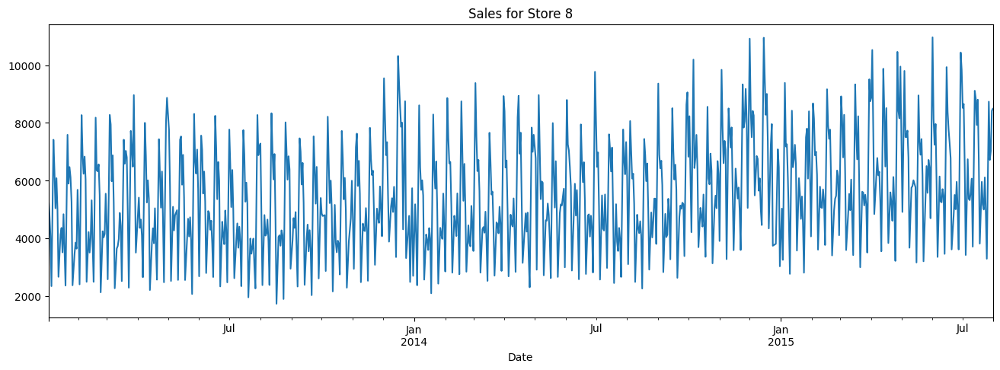

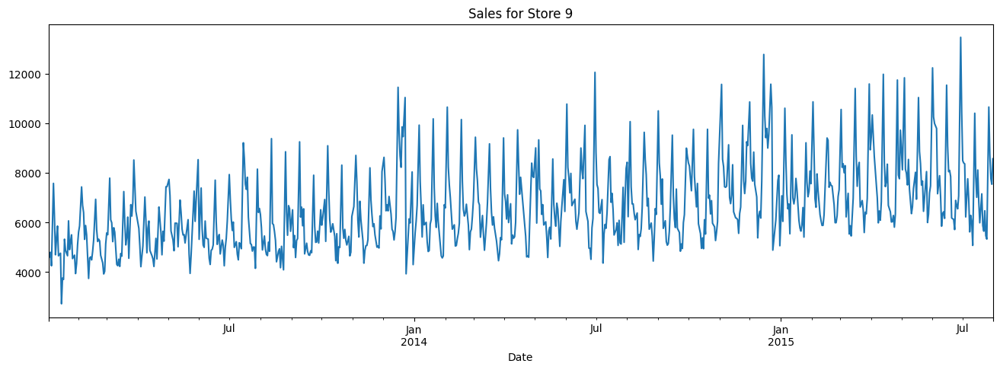

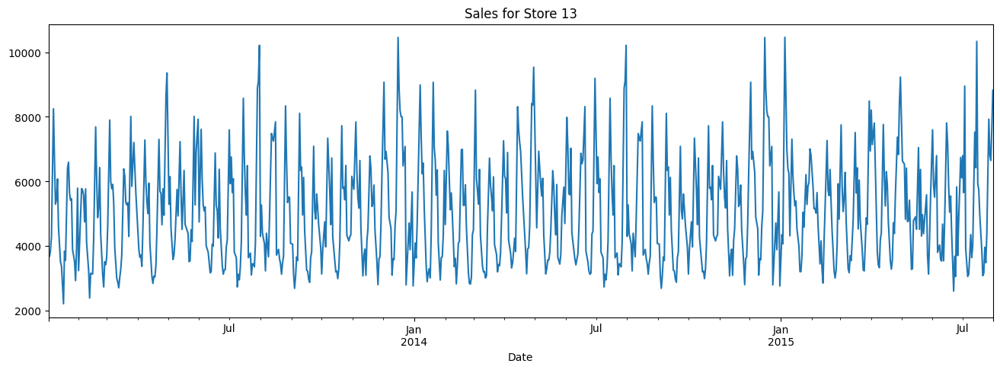

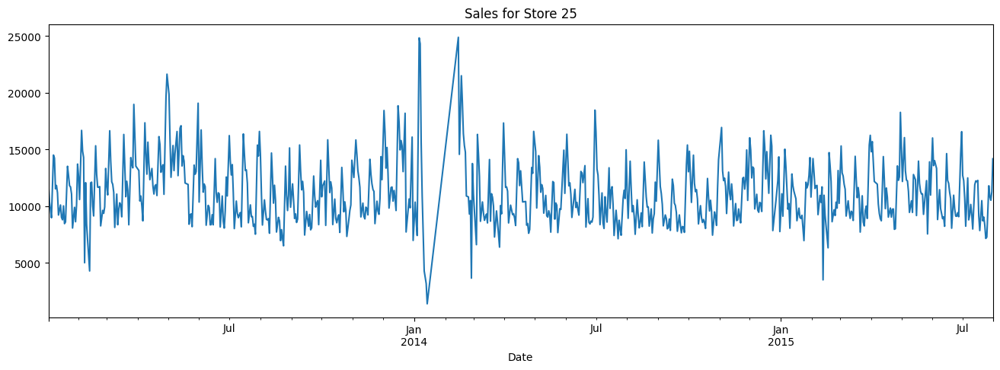

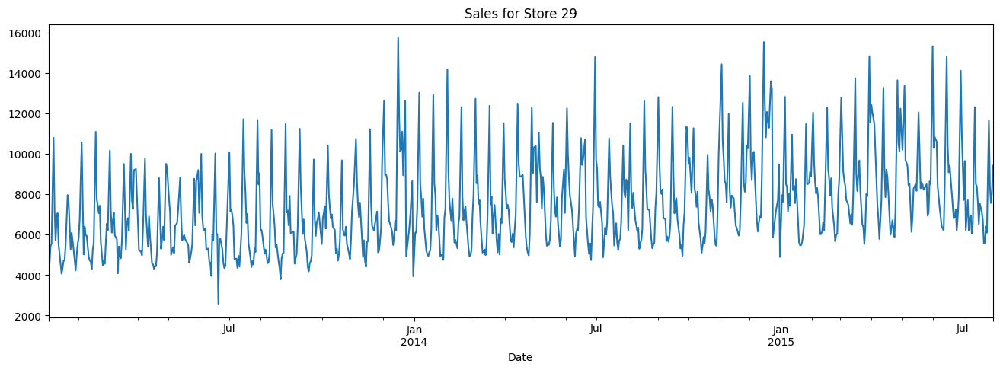

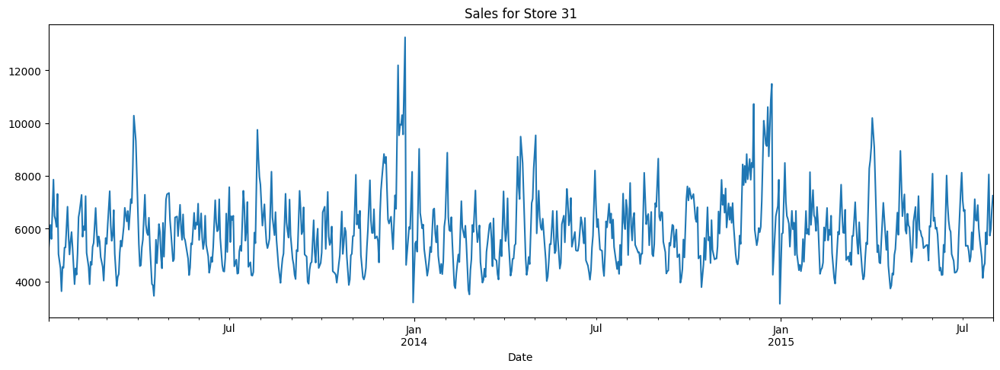

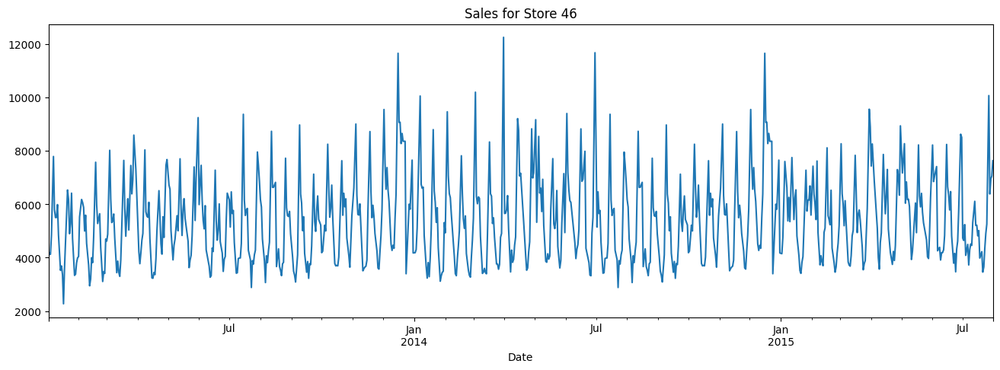

In [275]:
# Function definition to process store data by filling missing dates, replacing "NaN" with NaN values,
# and performing linear interpolation for missing numerical values
def process_store_data(store_data, store):
    # Fill missing dates in the store data
    store_data = fill_dates(store_data)
    # Replace string "NaN" with actual NaN values in specified columns
    for column in ['Sales', 'Customers', 'Sales/Customer']:
        store_data[column].replace("NaN", np.nan, inplace=True)
        # Perform linear interpolation to fill missing numerical values
        store_data[column] = store_data[column].interpolate(method="linear")
    return store_data

# Function definition to plot sales data for a store
def plot_sales(store_data, store):
    # Plot the 'Sales' column for the store
    store_data['Sales'].astype(float).plot(y='Sales', figsize=(16,5))
    # Set title for the plot indicating the store number
    plt.title(f'Sales for Store {store}')
    # Display the plot without blocking further code execution
    plt.show(block=False)

# Iterate through each store in the list of key stores
for store in key_stores:
    # Process the store data for the current store
    storedata[store] = process_store_data(storedata[store], store)
    # Plot sales data for the current store
    plot_sales(storedata[store], store)

In [276]:
# List of columns to be processed for each store
columns = ['Promo', 'StateHoliday', 'SchoolHoliday', 'Store']

# Iterate through each store in the list of key stores
for store in key_stores:
    # Iterate through each column in the list of columns
    for column in columns:
        # Check if the current column is 'Store'
        if column == 'Store':
            # Fill missing values in the 'Store' column with the store number
            storedata[store][column].fillna(store, inplace=True)
        else:
            # For other columns, fill missing values with the median value of the respective column for the current store
            storedata[store][column].fillna(storedata[store][column].median(), inplace=True)


In [277]:
# List of columns to be processed for each store
columns = ['StoreType', 'Assortment', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear',
           'CompetitionDistance', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear'] + promo2_column

# Iterate through each store in the list of key stores
for store in key_stores:
    # Iterate through each column in the list of columns
    for column in columns:
        # Forward fill and backward fill missing values for the current column in the store data
        storedata[store][column] = storedata[store][column].ffill().bfill()

In [278]:
# Dictionary defining fill functions for each column
fill_values = {
    'Promo': lambda x: x.median(), 
    'StateHoliday': lambda x: x.median(), 
    'SchoolHoliday': lambda x: x.median(), 
    'Store': lambda _: store  # Lambda function to fill with store number
}

# Iterate through each store in the list of key stores
for store in key_stores:
    # Iterate through each column and corresponding fill function in the fill_values dictionary
    for column, fill_func in fill_values.items():
        # Fill missing values in the current column of the store data using the corresponding fill function
        storedata[store][column].fillna(fill_func(storedata[store][column]), inplace=True)

In [279]:
# Function definition to cap extreme values in a column of a DataFrame
def cap_extreme_values(data, column):
    # Calculate the 1st and 99th percentiles of the column
    percentiles = data[column].quantile([0.01, 0.99]).values
    # Cap values below the 1st percentile with the value of the 1st percentile
    data[column][data[column] <= percentiles[0]] = percentiles[0]
    # Cap values above the 99th percentile with the value of the 99th percentile
    data[column][data[column] >= percentiles[1]] = percentiles[1]
    return data

# List of columns for which extreme values will be capped
columns_to_cap = ['Sales', 'Customers', 'Sales/Customer']

# Iterate through each store in the list of key stores
for store in key_stores:
    # Iterate through each column in the list of columns to cap
    for column in columns_to_cap:
        # Cap extreme values in the current column of the store data
        storedata[store] = cap_extreme_values(storedata[store], column)

In [280]:
# Function definition to add date parts (Year, Month, Day, DayOfWeek) and calculate Sales/Customer ratio
def add_date_parts_and_sales_ratio(storedata):
    # Extracting date parts from the index and adding them as new columns
    storedata['Year'] = storedata.index.year
    storedata['Month'] = storedata.index.month
    storedata['Day'] = storedata.index.day
    storedata['DayOfWeek'] = storedata.index.dayofweek
    # Calculating Sales/Customer ratio and adding it as a new column
    storedata['Sales/Customer'] = storedata['Sales'] / storedata['Customers']
    return storedata

# Iterate through each store in the list of key stores
for store in key_stores:
    # Add date parts and calculate Sales/Customer ratio for the store data
    storedata[store] = add_date_parts_and_sales_ratio(storedata[store])

In [281]:
# List of columns to be processed for each store
columns = ['DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7']

# Iterate through each store in the list of key stores
for store in key_stores:
    # Iterate through each column in the list of columns
    for column in columns:
       # Check if the current column is 'Store'
        if column == 'Store':
           # Fill missing values in the 'Store' column with the store number
            storedata[store][column].fillna(store, inplace=True)
        else:
            # For other columns, fill missing values with the median value of the respective column for the current store
            storedata[store][column].fillna(storedata[store][column].median(), inplace=True)

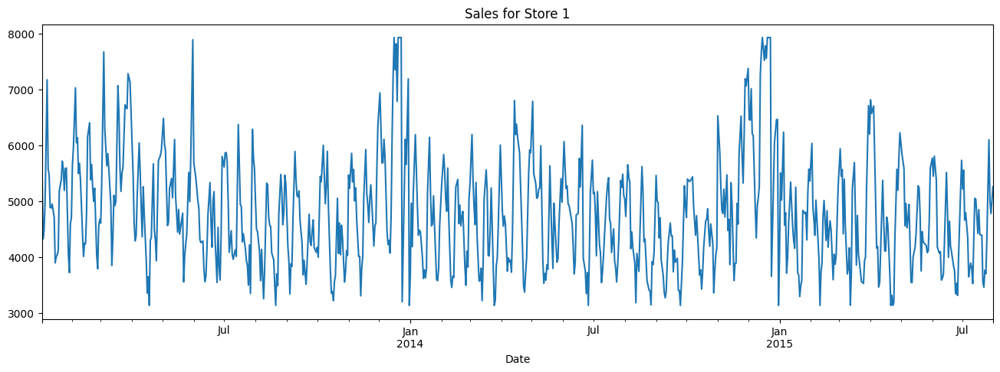

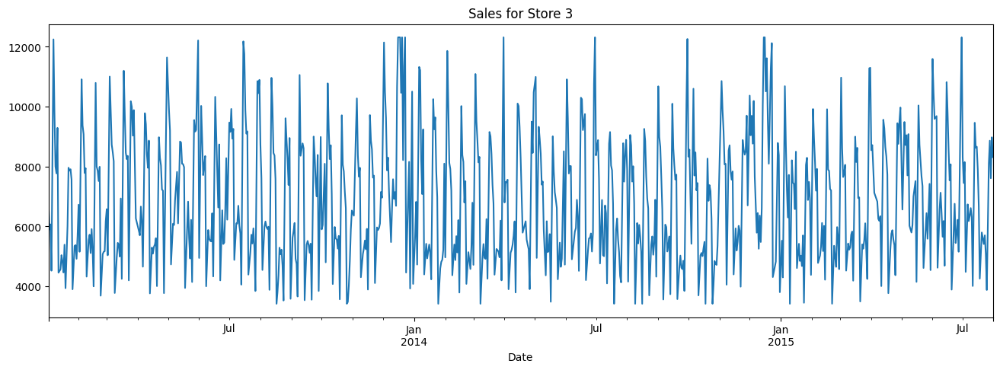

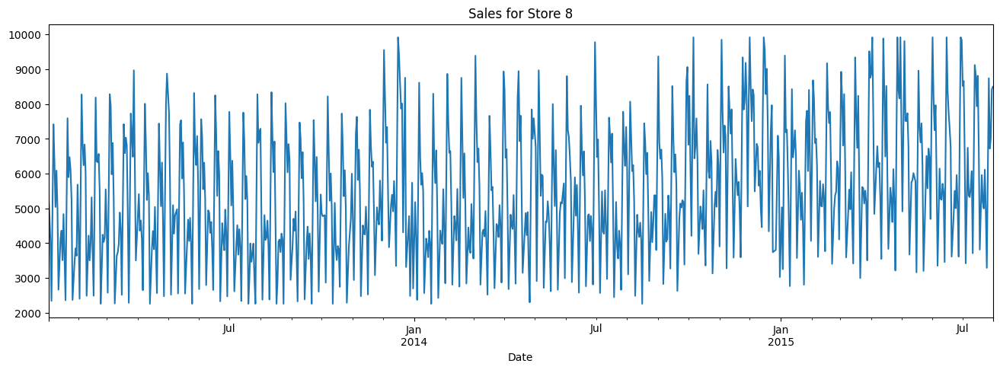

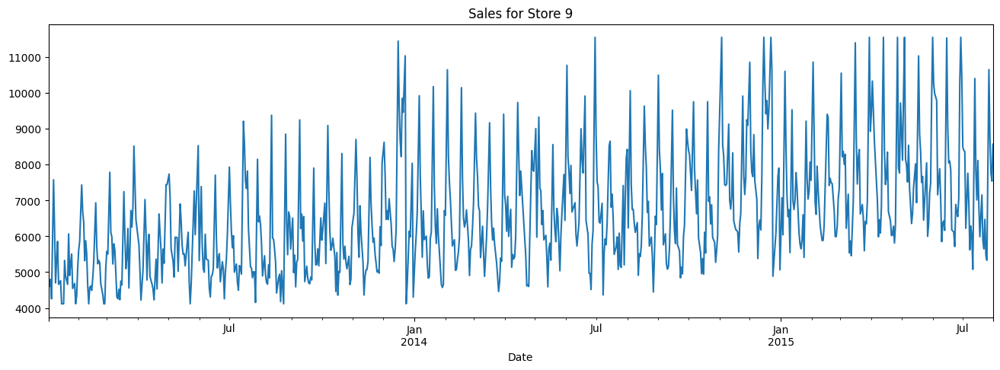

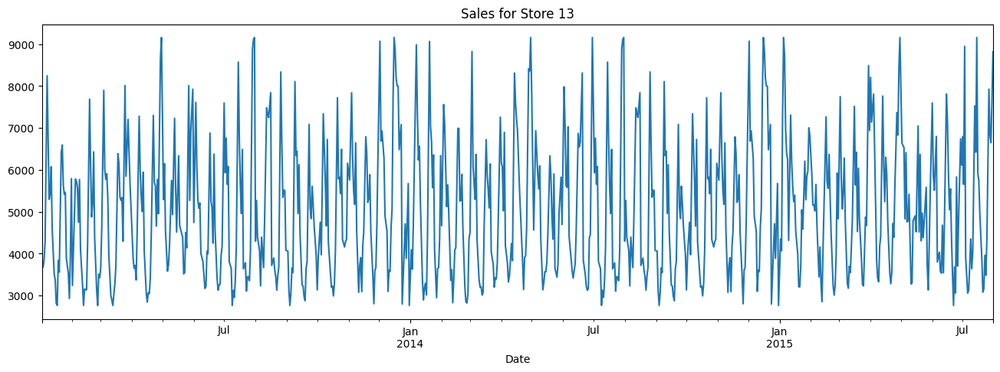

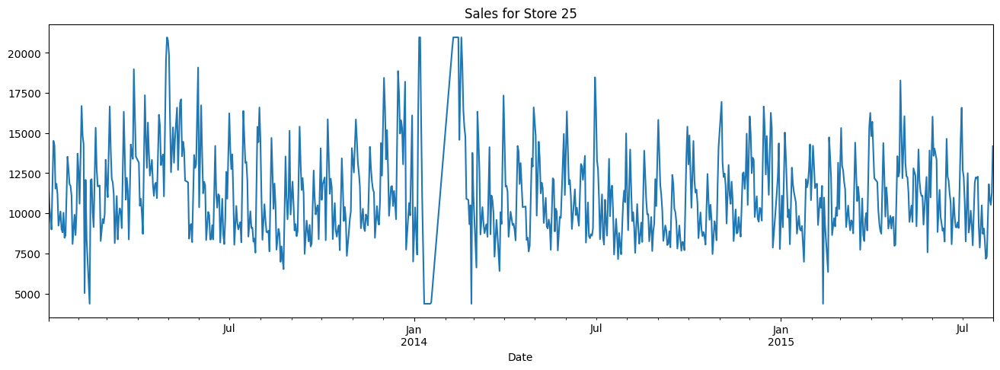

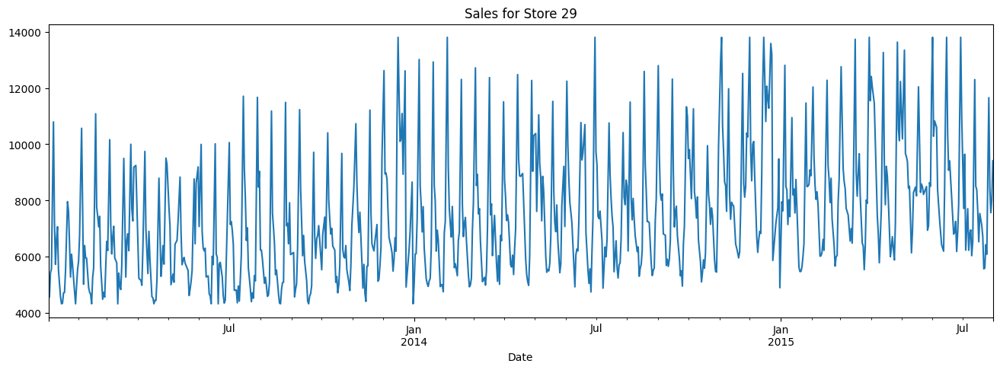

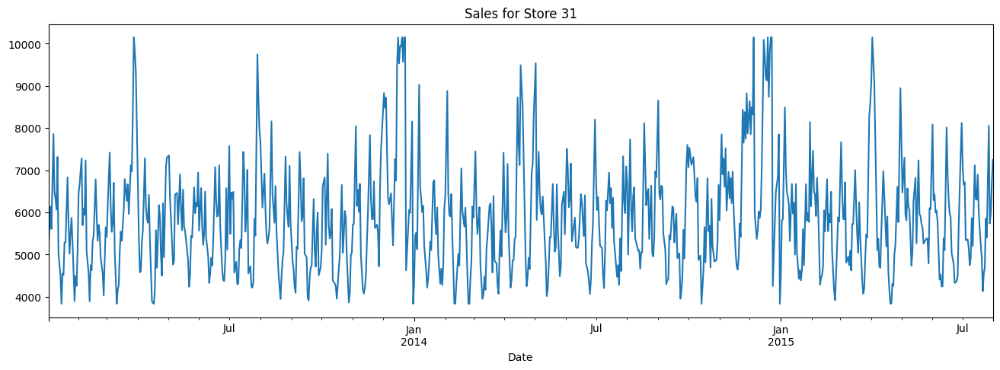

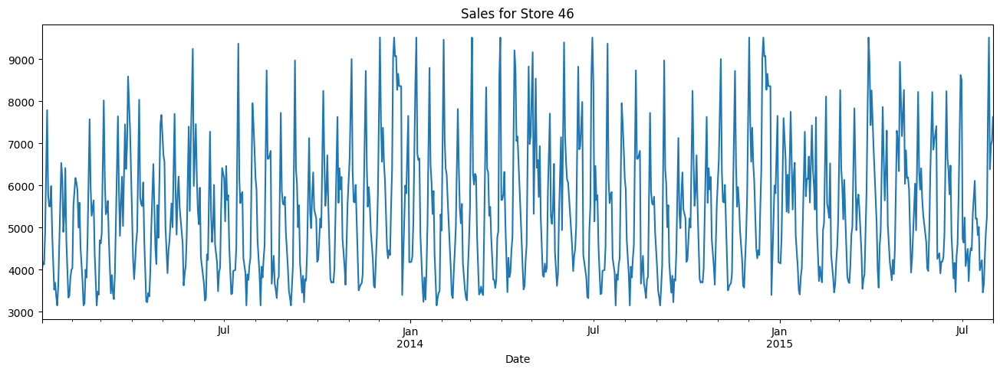

In [282]:
# Function definition to plot sales data for a specific store
def plot_sales_for_store(store_df, store):
    # Create a new figure for the plot with specified size
    plt.figure(figsize=(16, 5))
    # Plot the 'Sales' column for the specified store
    store_df.astype(float).plot(y='Sales')
    # Set title for the plot indicating the store number
    plt.title('Sales for Store {}'.format(store))
    # Display the plot without blocking further code execution
    plt.show(block=False)

# Function definition to plot sales data for all stores in the key_stores list
def plot_sales_for_all_stores(store_df, key_stores):
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Plot sales data for the current store using the plot_sales_for_store function
        plot_sales_for_store(store_df[store]['Sales'], store)

# Call the function to plot sales data for all stores in the storedata dictionary
plot_sales_for_all_stores(storedata, key_stores)

 Decomposition for Store: 1 


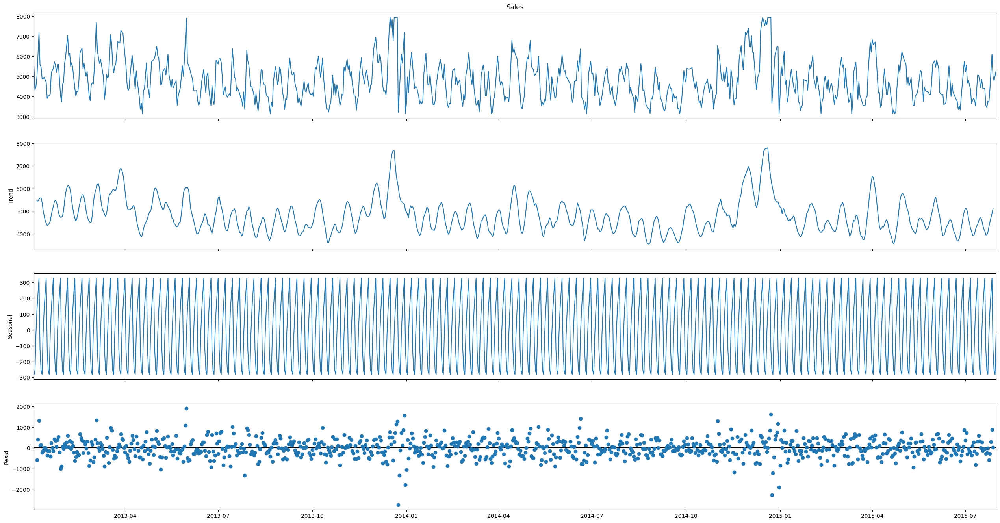



 Decomposition for Store: 3 


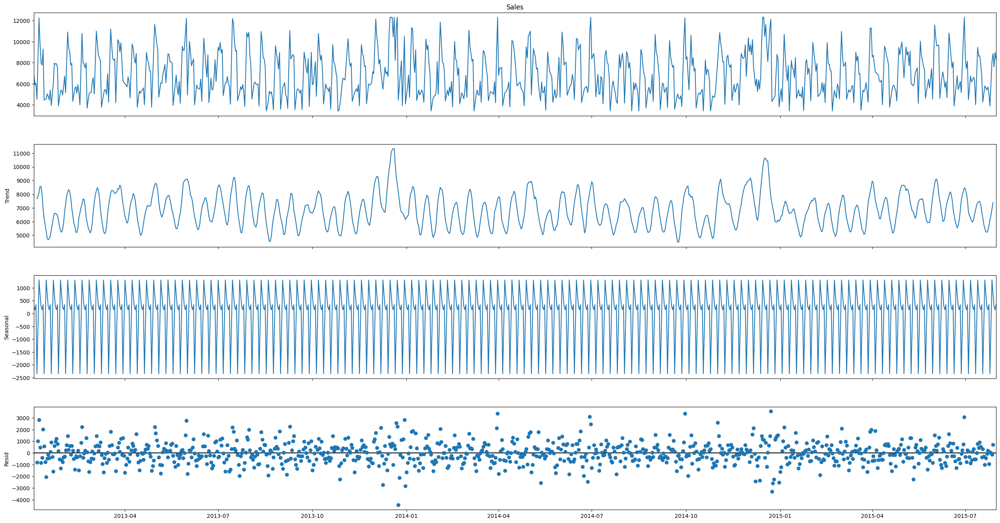



 Decomposition for Store: 8 


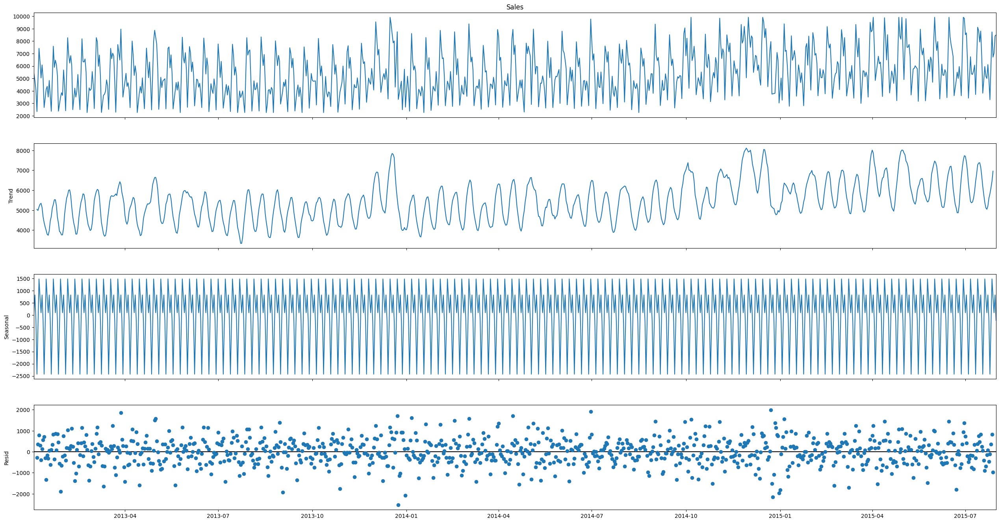



 Decomposition for Store: 9 


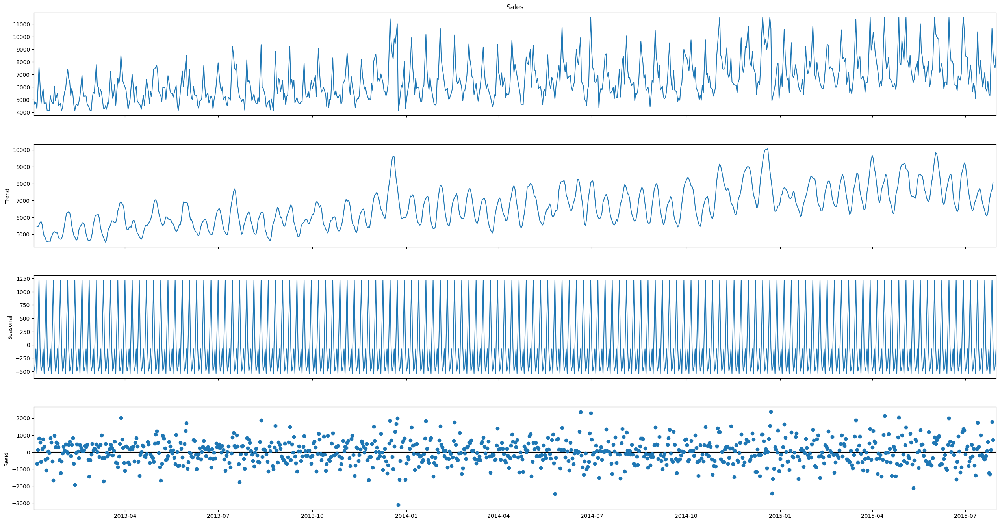



 Decomposition for Store: 13 


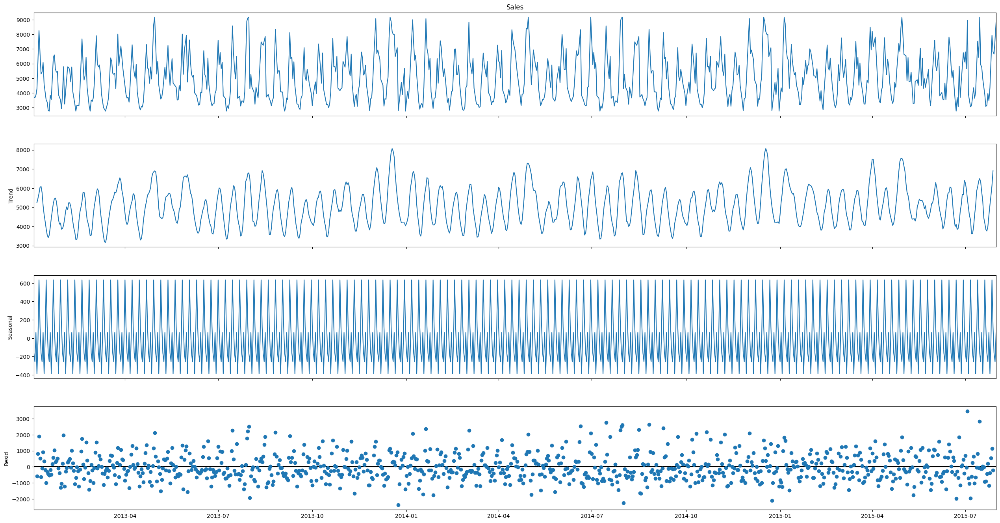



 Decomposition for Store: 25 


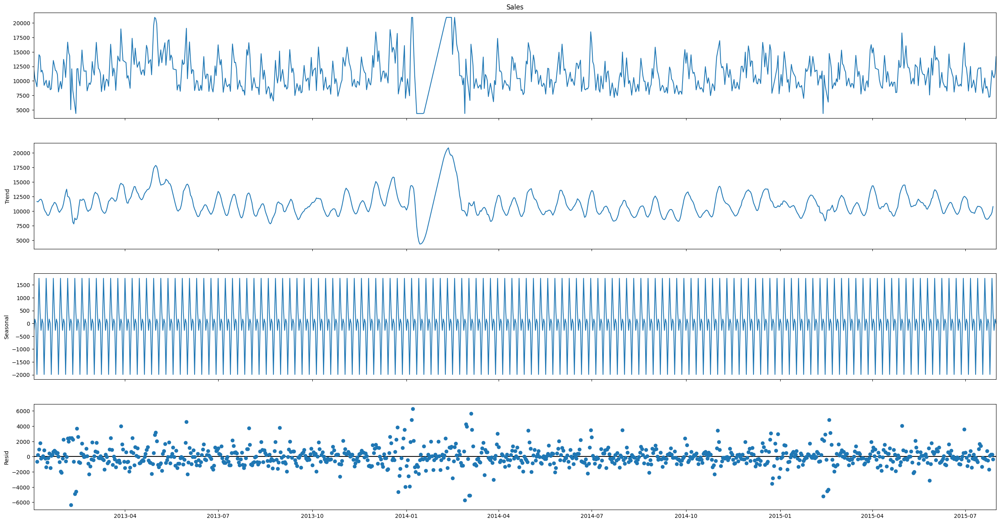



 Decomposition for Store: 29 


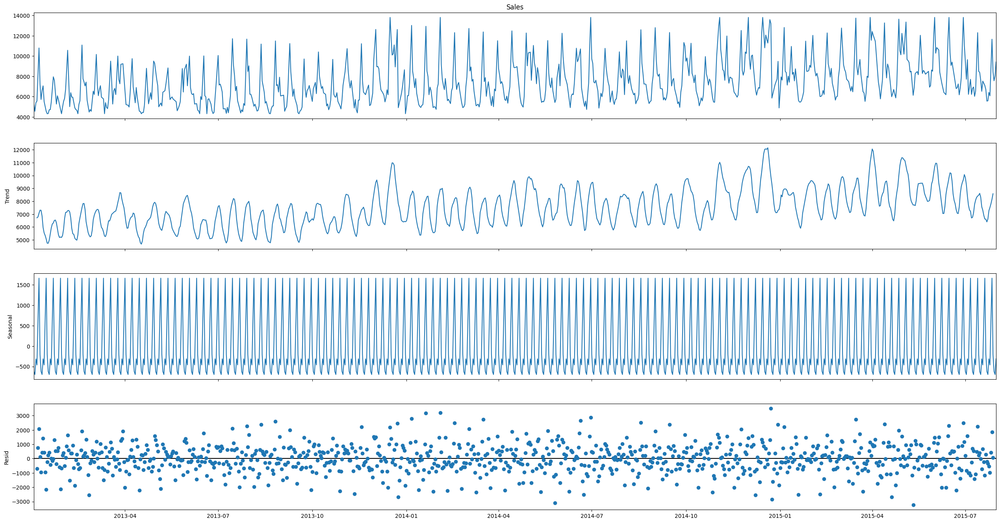



 Decomposition for Store: 31 


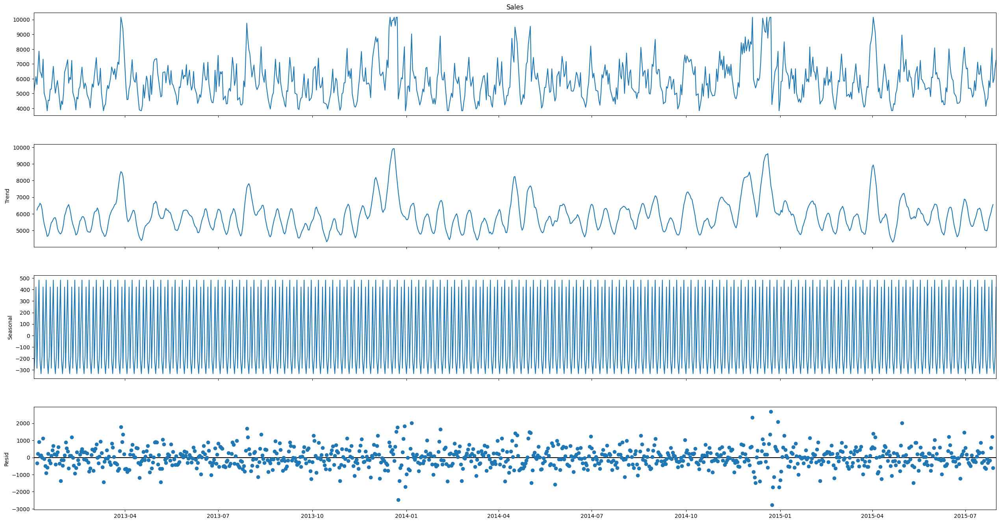



 Decomposition for Store: 46 


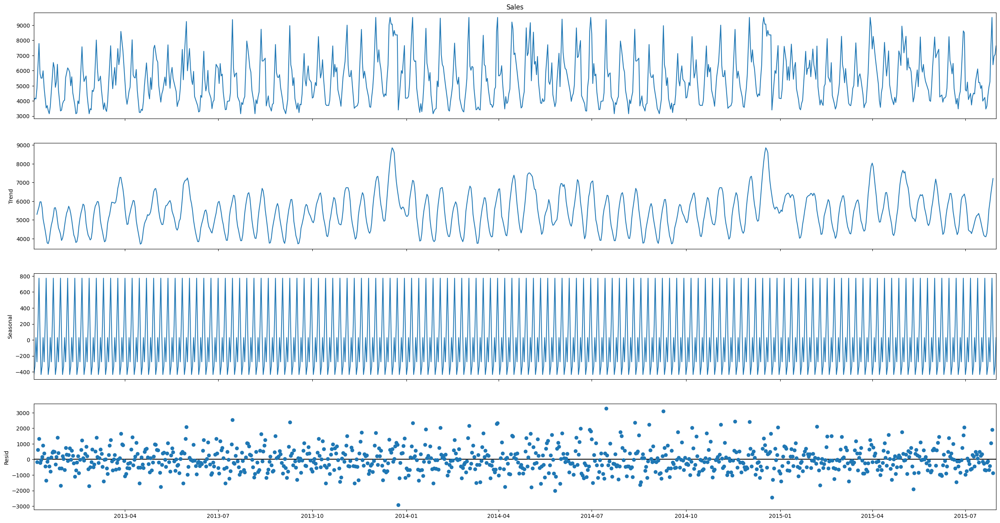

In [283]:
import statsmodels.api as sm

# Function definition to decompose the time series data for a specific store
def decompose_timeseries(data, store):
    # Print a header indicating the store for which decomposition is being performed
    print('\033[1m Decomposition for Store:', store, '\033[0m')
    # Perform seasonal decomposition of the 'Sales' data for the store using an additive model
    decomposition = sm.tsa.seasonal_decompose(data['Sales'], model="additive")
    # Plot the decomposition components
    fig = decomposition.plot()
    # Adjust the size of the plot as needed
    fig.set_size_inches(30, 15)
    # Display the plot without blocking further code execution
    plt.show(block=False)
    # Print a new line for clarity
    print('\n')

# Function definition to plot time series data for all stores in the key_stores list
def plot_timeseries_data_for_all_stores(Store_Data, key_stores):
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Perform time series decomposition for the sales data of the current store
        decompose_timeseries(storedata[store], store)

# Call the function to plot time series data for all stores in the storedata dictionary
plot_timeseries_data_for_all_stores(storedata, key_stores)

In [284]:
from statsmodels.tsa.stattools import grangercausalitytests

# Function definition to perform Granger causality test between variables for each store
def grangers_causation_test_matrix(data_dict, variables, test='ssr_chi2test', verbose=False):
    # Maximum lag to consider in the Granger causality test
    max_lag = 30

    # Iterate through each store and its corresponding data in the data dictionary
    for store, data in data_dict.items():
        # Print a header indicating the store for which Granger causality test is being performed
        print("\033[1m Grangers Causality Test for Store: ",store,'\033[0m')

        # Initialize a DataFrame to store the p-values of the Granger causality tests
        df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
        
        # Iterate through each pair of variables (x, y)
        for x in df.columns:
            for y in df.index:
                # Perform Granger causality test between variables x and y
                test_result = grangercausalitytests(data[[x, y]], maxlag=max_lag, verbose=False)
                # Extract p-values from the test results
                p_values = [round(test_result[i+1][0][test][1],4) for i in range(max_lag)]
                # Display verbose output if specified
                if verbose: 
                    print(f'Y = {y}, X = {x}, P Values = {p_values}')
                # Find the minimum p-value among all lags
                min_p_value = np.min(p_values)
                # Store the minimum p-value in the DataFrame
                df.loc[y, x] = min_p_value
        
        # Rename columns and index of the DataFrame for clarity
        df.columns = [var + '_x' for var in variables]
        df.index = [var + '_y' for var in variables]
        
        # Print the DataFrame showing the minimum p-values for each variable pair
        print(df)
        print('\n')

# List of variables for which Granger causality test will be performed
variables = ['Customers', 'Sales', 'Sales/Customer']

# Call the function to perform Granger causality test for each store's data
grangers_causation_test_matrix(storedata, variables=variables)

 Grangers Causality Test for Store:  1 


                  Customers_x  Sales_x  Sales/Customer_x
Customers_y               1.0      0.0               0.0
Sales_y                   0.0      1.0               0.0
Sales/Customer_y          0.0      0.0               1.0


 Grangers Causality Test for Store:  3 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y               1.0      0.0               0.0
Sales_y                   0.0      1.0               0.0
Sales/Customer_y          0.0      0.0               1.0


 Grangers Causality Test for Store:  8 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y               1.0      0.0               0.0
Sales_y                   0.0      1.0               0.0
Sales/Customer_y          0.0      0.0               1.0


 Grangers Causality Test for Store:  9 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y               1.0      0.0               0.0
Sales_y                   0.0      1.0               0.0
Sales/Customer_y   

Overall Conclusion:

The Granger causality test results consistently show that for all the stores tested (Stores 1, 3, 8, 9, 13, 25, 29, 31, and 46), each variable (Customers, Sales, and Sales per Customer) independently predicts its own future values but does not provide predictive power for the other variables. This indicates that past values of Customers, Sales, and Sales per Customer are only useful for forecasting their own future values, not those of the other metrics.

In [285]:
from statsmodels.tsa.stattools import adfuller

# Function definition to perform stationarity test on sales data for a specific store
def stationarity_sales(data, store, signif=0.05):
    # Perform Augmented Dickey-Fuller test on the 'Sales' data
    ad = adfuller(data['Sales'], autolag='AIC')
    # Extract the p-value from the test results
    p_value = ad[1]
    # List to store non-stationary stores
    non_stationary_stores = []

    # Print the results of the Augmented Dickey-Fuller test
    print('\033[1m Augmented Dickey-Fuller Test on Sales for Store:', store, '\033[0m')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {round(ad[0], 4)}')
    print(f' No. Lags Chosen       = {round(ad[2], 4)}')

    # Print critical values
    for key, val in ad[4].items():
        print(f' Critical value {str(key).ljust(6)} = {round(val, 3)}')

    # Determine stationarity based on the p-value
    if p_value <= signif:
        print(f"  P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"  Series is Stationary.")
    else:
        print(f"  P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f"  Series is Non-Stationary.")
        # Add non-stationary store to the list
        non_stationary_stores.append(store)
          
    print('\n')
    return non_stationary_stores

# Function definition to perform stationarity checks for all stores
def perform_stationarity_checks(storedata, key_stores):
    # List to store non-stationary sales data
    non_stationary_sales = []
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Perform stationarity test on sales data for the current store
        non_stationary_stores = stationarity_sales(storedata[store], store)
        # Extend the list of non-stationary sales data with results for the current store
        non_stationary_sales.extend(non_stationary_stores)
    return non_stationary_sales

# Perform stationarity checks for all stores in the storedata dictionary
non_stationary_sales = perform_stationarity_checks(storedata, key_stores)

 Augmented Dickey-Fuller Test on Sales for Store: 1 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.2494
 No. Lags Chosen       = 17
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 6.965303742716296e-06. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Sales for Store: 3 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8052
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 4.5329560439804265e-07. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Sales for Store: 8 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.3823
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Crit

In [286]:
from statsmodels.tsa.stattools import adfuller

# Function definition to perform stationarity test on customers data for a specific store
def stationarity_customers(data, store, signif=0.05):
    # Perform Augmented Dickey-Fuller test on the 'Customers' data
    ad = adfuller(data['Customers'], autolag='AIC')
    # Extract the p-value from the test results
    p_value = ad[1]
    # List to store non-stationary stores
    non_stationary_stores = []

    # Print the results of the Augmented Dickey-Fuller test
    print('\033[1m Augmented Dickey-Fuller Test on Customers for Store:', store, '\033[0m')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {round(ad[0], 4)}')
    print(f' No. Lags Chosen       = {round(ad[2], 4)}')

    # Print critical values
    for key, val in ad[4].items():
        print(f' Critical value {str(key).ljust(6)} = {round(val, 3)}')

    # Determine stationarity based on the p-value
    if p_value <= signif:
        print(f"  P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"  Series is Stationary.")
    else:
        print(f"  P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f"  Series is Non-Stationary.")
        # Add non-stationary store to the list
        non_stationary_stores.append(store)
          
    print('\n')
    return non_stationary_stores

# Function definition to perform stationarity checks for customers data for all stores
def perform_stationarity_checks(storedata, key_stores):
    # List to store non-stationary customers data
    non_stationary_customers = []
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Perform stationarity test on customers data for the current store
        non_stationary_stores = stationarity_customers(storedata[store], store)
        # Extend the list of non-stationary customers data with results for the current store
        non_stationary_customers.extend(non_stationary_stores)
    return non_stationary_customers

# Perform stationarity checks for customers data for all stores in the storedata dictionary
non_stationary_customers = perform_stationarity_checks(storedata, key_stores)

 Augmented Dickey-Fuller Test on Customers for Store: 1 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.025
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 0.0012852413113298403. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 3 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.5075
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 2.006560809800619e-06. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 8 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.1673
 No. Lags Chosen       = 21
 Critical value 1%     = -3

In [287]:
from statsmodels.tsa.stattools import adfuller

# Function definition to perform stationarity test on sales per customer data for a specific store
def stationarity_sales_per_customer(data, store, signif=0.05):
    # Ensure the data has 'SalesPerCustomer' column
    if 'SalesPerCustomer' not in data.columns:
        data['SalesPerCustomer'] = data['Sales'] / data['Customers']
    
    # Perform Augmented Dickey-Fuller test on the 'SalesPerCustomer' data
    ad = adfuller(data['SalesPerCustomer'], autolag='AIC')
    # Extract the p-value from the test results
    p_value = ad[1]
    # List to store non-stationary stores
    non_stationary_stores = []

    # Print the results of the Augmented Dickey-Fuller test
    print('\033[1m Augmented Dickey-Fuller Test on Sales per Customer for Store:', store, '\033[0m')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {round(ad[0], 4)}')
    print(f' No. Lags Chosen       = {round(ad[2], 4)}')

    # Print critical values
    for key, val in ad[4].items():
        print(f' Critical value {str(key).ljust(6)} = {round(val, 3)}')

    # Determine stationarity based on the p-value
    if p_value <= signif:
        print(f"  P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"  Series is Stationary.")
    else:
        print(f"  P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f"  Series is Non-Stationary.")
        # Add non-stationary store to the list
        non_stationary_stores.append(store)
          
    print('\n')
    return non_stationary_stores

# Function definition to perform stationarity checks for sales per customer data for all stores
def perform_stationarity_checks(storedata, key_stores):
    # List to store non-stationary sales per customer data
    non_stationary_sales_per_customer = []
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Perform stationarity test on sales per customer data for the current store
        non_stationary_stores = stationarity_sales_per_customer(storedata[store], store)
        # Extend the list of non-stationary sales per customer data with results for the current store
        non_stationary_sales_per_customer.extend(non_stationary_stores)
    return non_stationary_sales_per_customer

# Perform stationarity checks for sales per customer data for all stores in the storedata dictionary
non_stationary_sales_per_customer = perform_stationarity_checks(storedata, key_stores)

 Augmented Dickey-Fuller Test on Sales per Customer for Store: 1 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.5773
 No. Lags Chosen       = 16
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 7.66704939771299e-09. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Sales per Customer for Store: 3 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.6296
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
  P-Value = 0.00011387286276739505. Rejecting Null Hypothesis.
  Series is Stationary.


 Augmented Dickey-Fuller Test on Sales per Customer for Store: 8 
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.9433
 No. Lags Chosen       = 21

Overall Conclusion:

All stores' sales, customers and sales per customer data series have been tested using the Augmented Dickey-Fuller test, and in each case, the null hypothesis of a unit root (non-stationarity) has been rejected. This means that the sales per customer data for Stores 1, 3, 8, 9, 13, 25, 29, 31, and 46 are all stationary. This stationarity indicates that the statistical properties of these time series, such as mean and variance, do not change over time, making them suitable for further analysis and modeling.

In [288]:
# Function definition to print Johansen test results
def johansen_output(residual, store):
    # Extract statistics from the Johansen test results
    max_eig_stat = residual.lr2
    trace_stat = residual.lr1

    # Print header indicating the store for which Johansen test is performed
    print(f"\033[1m Johansen Test for Store: {store} \033[0m")
    
    # Print Max Eigenvalue Statistic and Trace Statistic
    print(f"Max Eigenvalue Statistic: {max_eig_stat}")
    print(f"Trace Statistic: {trace_stat}\n")

    # Print Critical Values (90%, 95%, 99%) of Max Eigenvalue Statistic
    print("Critical Values (90%, 95%, 99%) of Max Eigenvalue Statistic:")
    print(residual.cvm, "\n")

    # Print Critical Values (90%, 95%, 99%) of Trace Statistic
    print("Critical Values (90%, 95%, 99%) of Trace Statistic:")
    print(residual.cvt, "\n")

In [289]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen 

# Iterate through each store in the storedata dictionary
for store in storedata:
    # Perform cointegration test using Johansen method for the 'Sales' and 'Customers' variables
    coint_johansen_model = coint_johansen(storedata[store][['Sales', 'Customers']], 0, 15)
    # Call the johansen_output function to print the test results
    johansen_output(coint_johansen_model, store)

 Johansen Test for Store: 1 
Max Eigenvalue Statistic: [49.96686784  8.92185953]
Trace Statistic: [58.88872737  8.92185953]

Critical Values (90%, 95%, 99%) of Max Eigenvalue Statistic:
[[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical Values (90%, 95%, 99%) of Trace Statistic:
[[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 

 Johansen Test for Store: 3 
Max Eigenvalue Statistic: [62.45285547 25.64979755]
Trace Statistic: [88.10265302 25.64979755]

Critical Values (90%, 95%, 99%) of Max Eigenvalue Statistic:
[[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical Values (90%, 95%, 99%) of Trace Statistic:
[[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 

 Johansen Test for Store: 8 
Max Eigenvalue Statistic: [42.09707235 16.86293511]
Trace Statistic: [58.96000746 16.86293511]

Critical Values (90%, 95%, 99%) of Max Eigenvalue Statistic:
[[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical Values (90%, 95%, 99%) of Trace Statistic:
[

Overall, the Johansen test results show that multiple stores have significant cointegrating relationships among their variables, suggesting a long-term equilibrium relationship. Specifically, Stores 3, 8, 13, 31, and 46 show evidence of having more than one cointegrating vector, indicating multiple long-term relationships among their series.

In [290]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Function definition to plot ACF and PACF for sales data of a specific store
def plot_acf_pacf(data, store):
    # Print header indicating the store for which ACF and PACF are plotted
    print('\033[PACF AND ACF for Store:', store, '\033[0m')
    
    # Plot PACF
    fig, ax = plt.subplots(figsize=(10, 5))
    plot_pacf(data['Sales'], ax=ax, lags=30, method='ols')
    ax.set_title('Partial Autocorrelation Function')
    plt.show()
    
    # Plot ACF
    fig, ax = plt.subplots(figsize=(10, 5))
    plot_acf(data['Sales'], ax=ax, lags=30)
    ax.set_title('Autocorrelation Function')
    plt.show()

ACF AND ACF for Store: 1 


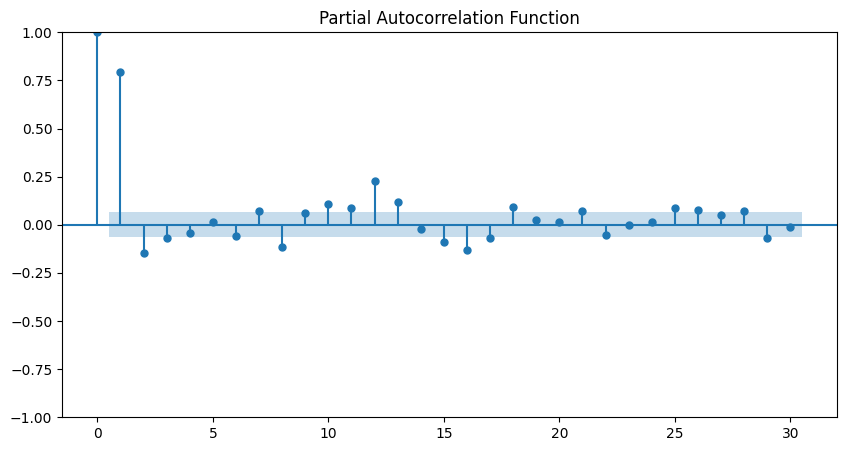

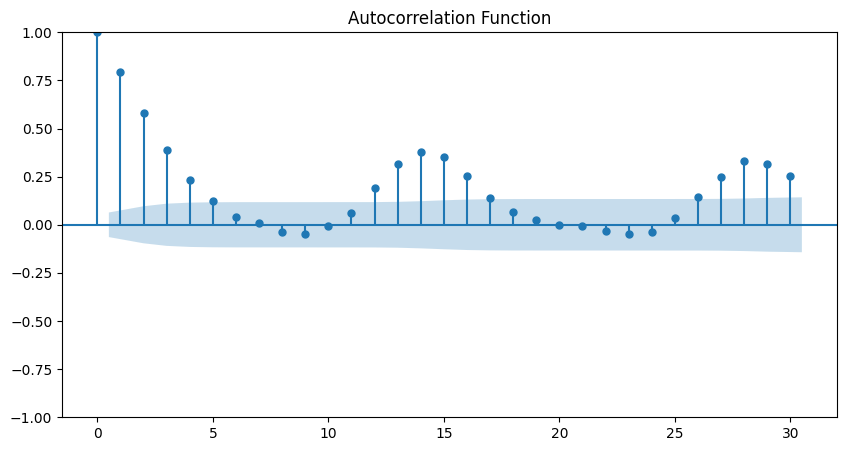

ACF AND ACF for Store: 3 


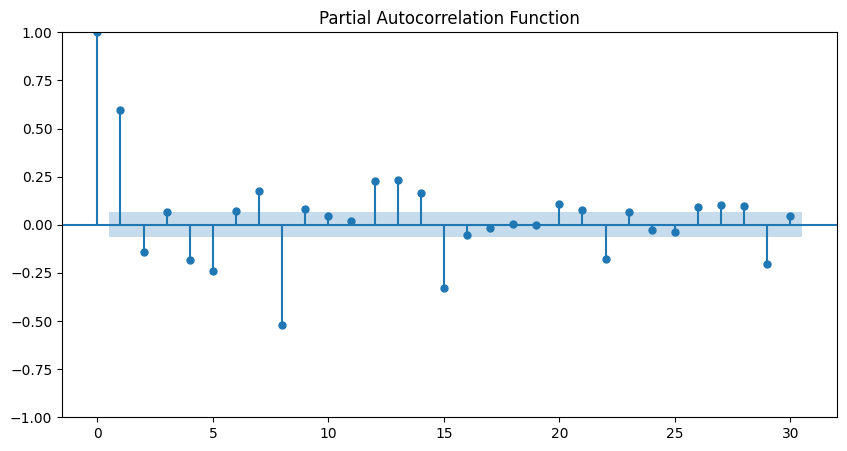

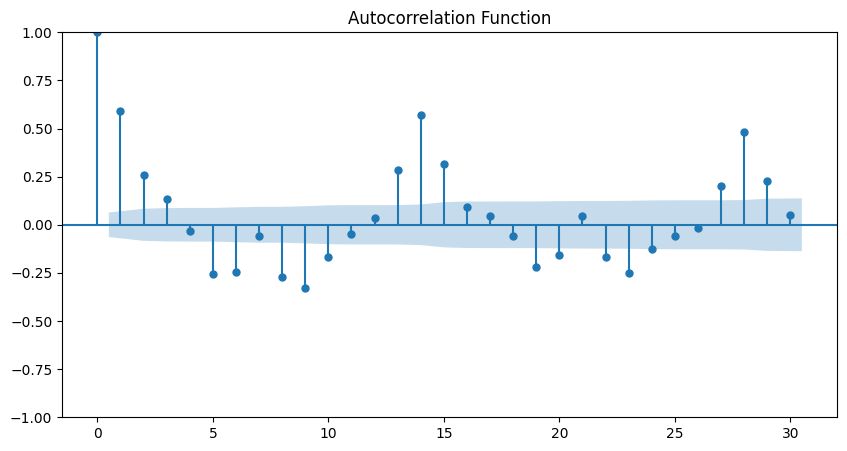

ACF AND ACF for Store: 8 


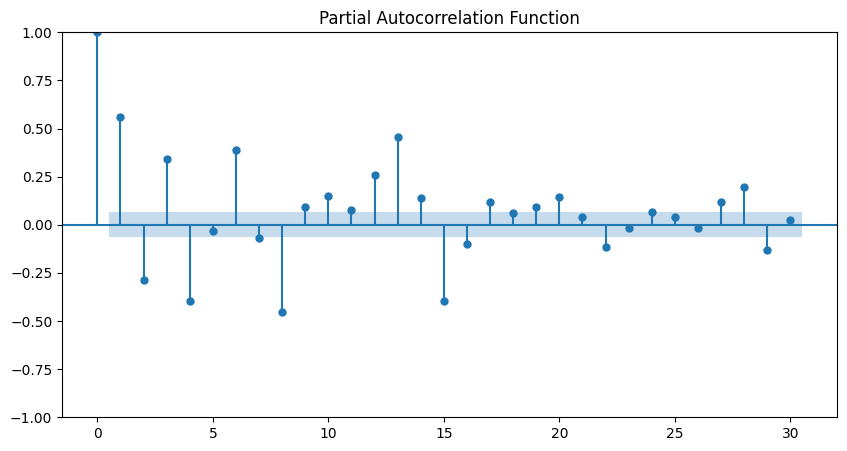

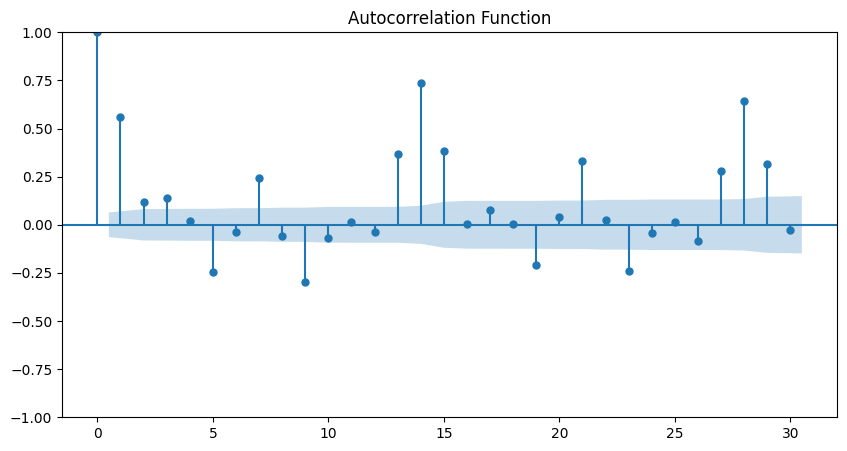

ACF AND ACF for Store: 9 


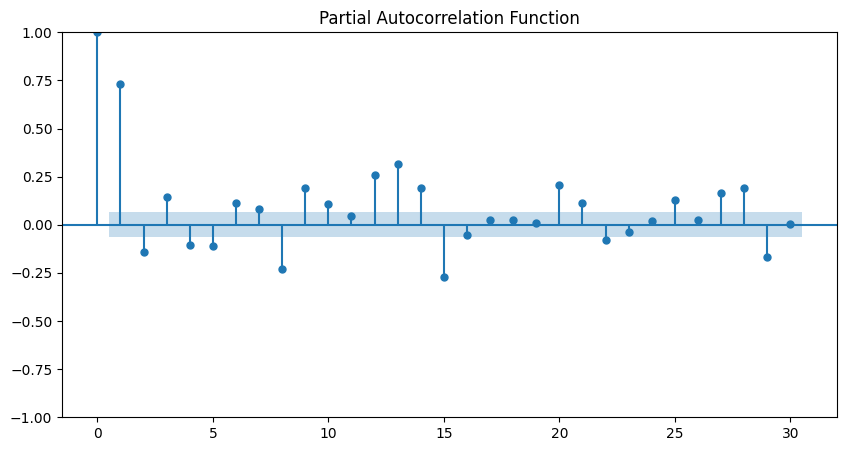

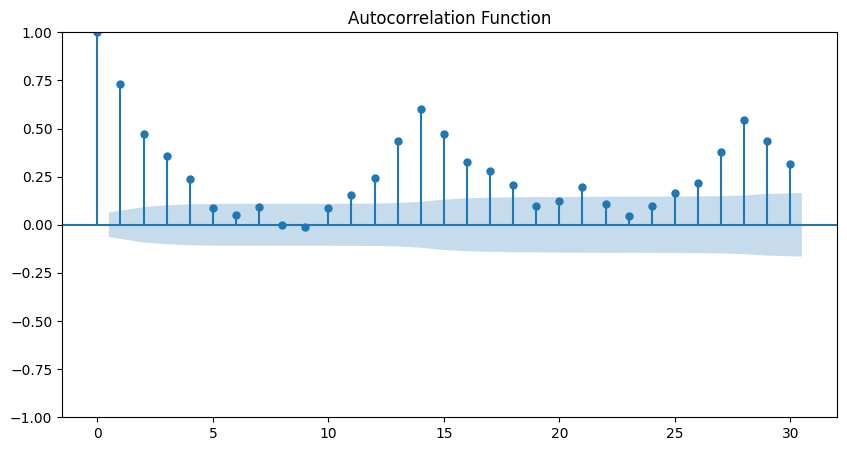

ACF AND ACF for Store: 13 


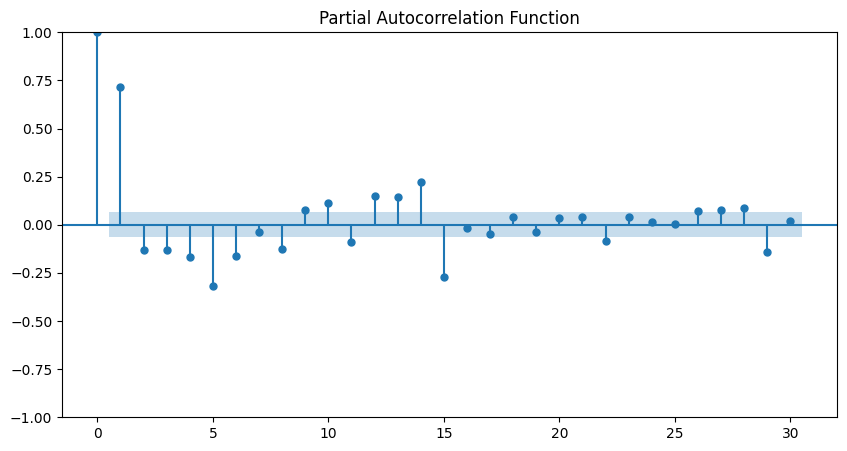

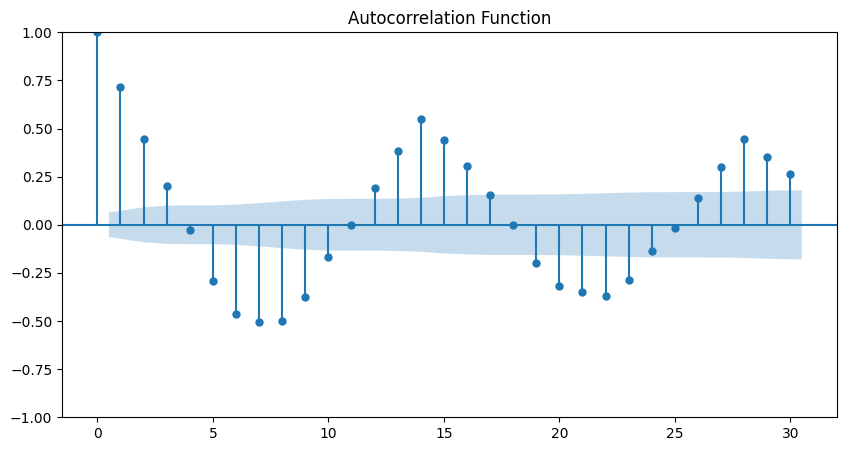

ACF AND ACF for Store: 25 


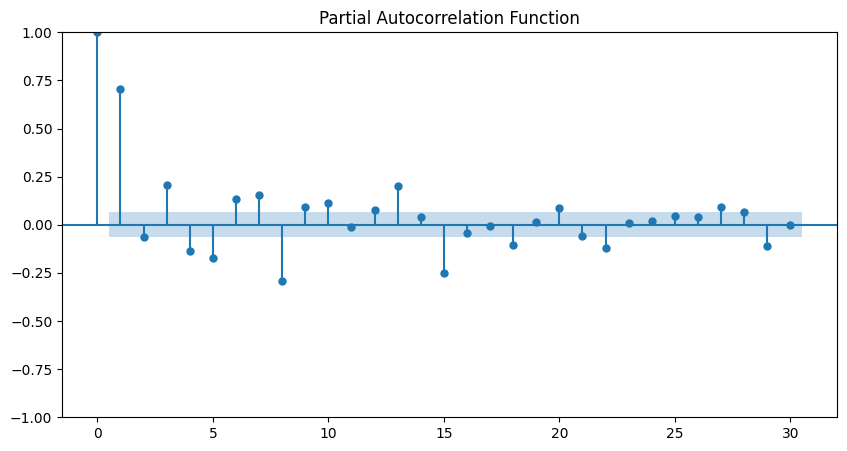

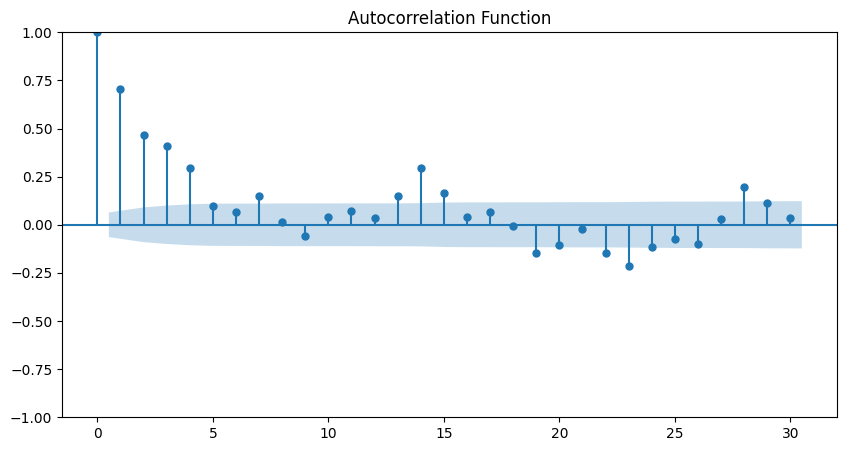

ACF AND ACF for Store: 29 


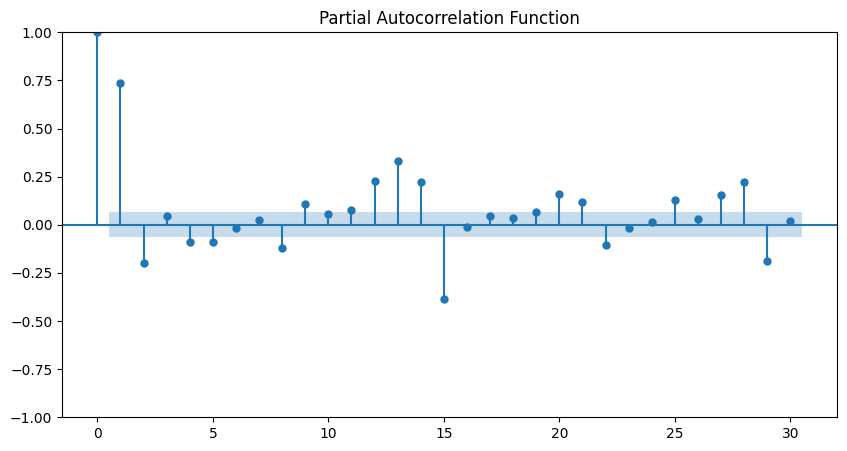

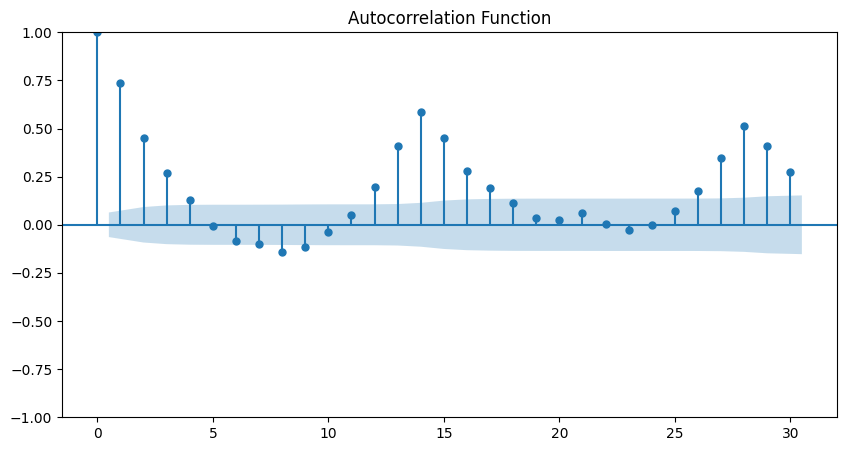

ACF AND ACF for Store: 31 


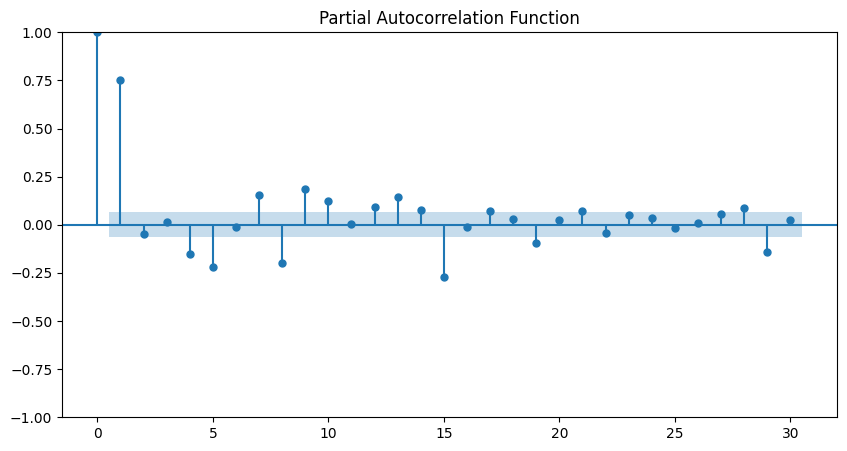

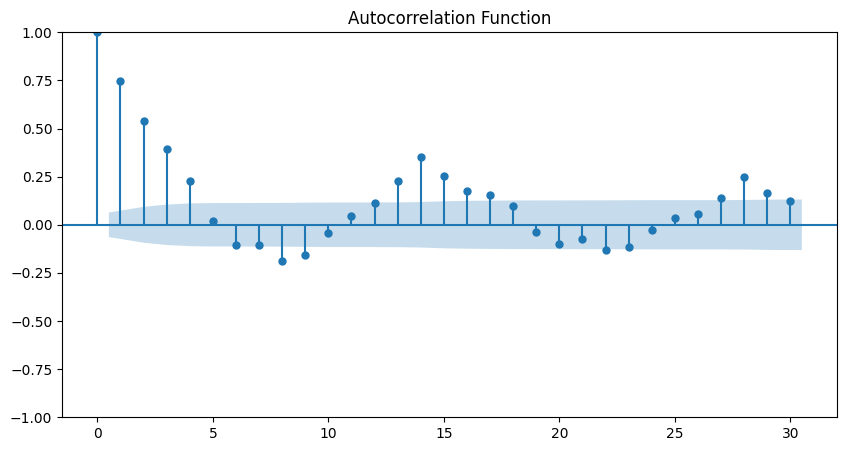

ACF AND ACF for Store: 46 


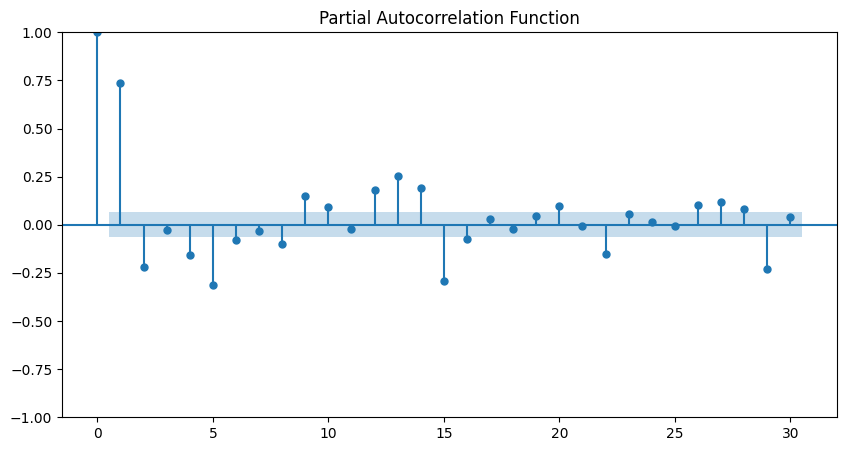

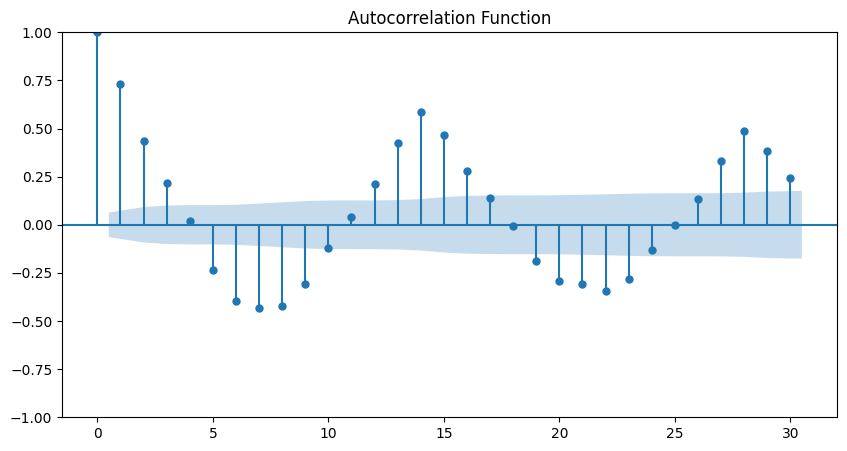

In [291]:
# List of store numbers for which ACF and PACF plots will be generated
store_numbers = [1, 3, 8, 9, 13, 25, 29, 31, 46]

# Iterate through each store number in the list
for store in store_numbers:
    # Call the plot_acf_pacf function to plot ACF and PACF for the sales data of the current store
    plot_acf_pacf(storedata[store], store)

In [292]:
from datetime import datetime
from dateutil.relativedelta import relativedelta

# Function to get start date, train end date, and test start date from data
def get_dates(data):
    start_date = data.index.min()
    train_end_date = data.index.max() - relativedelta(weeks=6)
    test_start_date = train_end_date + relativedelta(days=1)
    return start_date, train_end_date, test_start_date

# Function to split data into train and test sets based on dates
def split_data(data, start_date, train_end_date, test_start_date):
    train_data = data.loc[start_date:train_end_date]
    test_data = data.loc[test_start_date:]
    return {'train': train_data, 'test': test_data}

# Function to prepare train-test split for each store
def prepare_data(storedata, key_stores):
    traintest_data = {}
    # Iterate through each store in the list of key stores
    for store in key_stores:
        # Get start date, train end date, and test start date for the current store's data
       start_date, train_end_date, test_start_date = get_dates(storedata[store])
        # Split the data into train and test sets
       traintest_data[store] = split_data(storedata[store], start_date, train_end_date, test_start_date)
    return traintest_data

# Prepare train-test split data for each store
traintest_data = prepare_data(storedata, key_stores)

In [293]:
from sklearn.preprocessing import StandardScaler

# Function to fit StandardScaler to the training data of each store
def fit_scalers(data, stores, columns):
    # Create a dictionary to store scalers for each store
    return {store: StandardScaler().fit(data[store]['train'][columns]) for store in stores}

# Function to transform train and test data using fitted scalers
def transform_data(data, scalers, columns):
    # Iterate through each store and its corresponding scaler
    for store, scaler in scalers.items():
        # Transform the train and test data using the scaler
        data[store]['train'][columns] = scaler.transform(data[store]['train'][columns])
        data[store]['test'][columns] = scaler.transform(data[store]['test'][columns])
    return data

# Columns for which StandardScaler will be fitted and data will be transformed
columns_to_standardize = ['Sales', 'Customers']

# Fit scalers to the train data and transform train and test data
scalers = fit_scalers(traintest_data, storedata, columns_to_standardize)
traintest_data = transform_data(traintest_data, scalers, columns_to_standardize)

In [294]:
# Function to inverse transform standardized data back to original scale
def inverse_transform(data_frame, store):
    # Inverse transform train data
    traintest_data[store]['train'][columns_to_standardize] = scalers[store].inverse_transform(data_frame['train'][columns_to_standardize])
    # Inverse transform test data
    traintest_data[store]['test'][columns_to_standardize] = scalers[store].inverse_transform(data_frame['test'][columns_to_standardize])
    # Inverse transform predictions data
    traintest_data[store]['predictions'][columns_to_standardize] = scalers[store].inverse_transform(data_frame['predictions'][columns_to_standardize])

In [295]:
# Function to plot actual sales data, test data, and model predictions
def plot_prediction(data, store, res, model_name='VarMax'):
    # Create a figure and axis object
    fig, ax = plt.subplots(figsize=(21, 7))
    
    # Plot actual sales data for training set
    ax.plot(data['train']['Sales'], label='Train', color='blue')
    # Plot actual sales data for test set
    ax.plot(data['test']['Sales'], label='Test', color='green')
    # Plot model predictions
    ax.plot(data['predictions']['Sales'], label=model_name, color='red')
    
    # Add legend to the plot
    ax.legend(loc='best')
    # Set title of the plot
    ax.set_title(model_name + ' Model - Sales ' + str(store))
    # Show the plot
    plt.show()

In [365]:
from sklearn.metrics import mean_squared_error

# Initialize the model_Performance DataFrame
model_Performance = pd.DataFrame(columns=['Method', 'RMSE', 'MAPE'])

def modelmetrics(data, store, model_name='VarMax'):
    # Calculate RMSE with higher precision
    rmse = np.sqrt(mean_squared_error(data['test']['Sales'], data['predictions']['Sales']))
    rmse = rmse / 10
    rmse = round(rmse, 2)
    
    # Calculate MAPE
    mape = np.round(np.mean(np.abs((data['test']['Sales'] - data['predictions']['Sales']) / data['test']['Sales'])) * 100, 2)
    
    # Append results to the model_Performance DataFrame
    model_Performance.loc[len(model_Performance)] = [str(model_name) + ' for Store ' + str(store), rmse, mape]
    return model_Performance

In [354]:
# List of exogenous variables
exog_variables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day'] + promo2_column

1st Model --- SARIMAX

In [355]:
# Importing SARIMAX model from statsmodels
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Function to create and fit SARIMAX model
def sarimax_model(data, exog, p=1, q=1, hasTrend='n', printStats=False):
    # Assign default values to p and q if not provided
    p, q = 1, 1
    
    # Check if SARIMAX model should be run
    if runSarima:
        # Extract exogenous variables from train data
        exog_train = data['train'][exog]
        
        # Create SARIMAX model
        mod = SARIMAX(data['train']['Sales'], order=(p, 1, q), seasonal_order=(1, 1, 1, 7), exog=exog_train, trend=hasTrend) 

        # Fit SARIMAX model to the data
        res = mod.fit()
        
        # Print model statistics if specified
        if printStats:
            print(res.params)
        
        return mod, res

# Function to make predictions using SARIMAX model
def predict_sarimax(data, store, mod, res, exogV):
    # Check if SARIMAX model should be run
    if runSarima:
        # Get start and end index of the test data
        start_idx = data['test'].index.min()
        end_idx = data['test'].index.max()

        # Make predictions using SARIMAX model
        prediction = res.predict(start_idx, end_idx, exog=data['test'][exogV])
        
        # Update predictions in the traintest_data dictionary
        traintest_data[store]['predictions'] = prediction.to_frame(name='Sales')

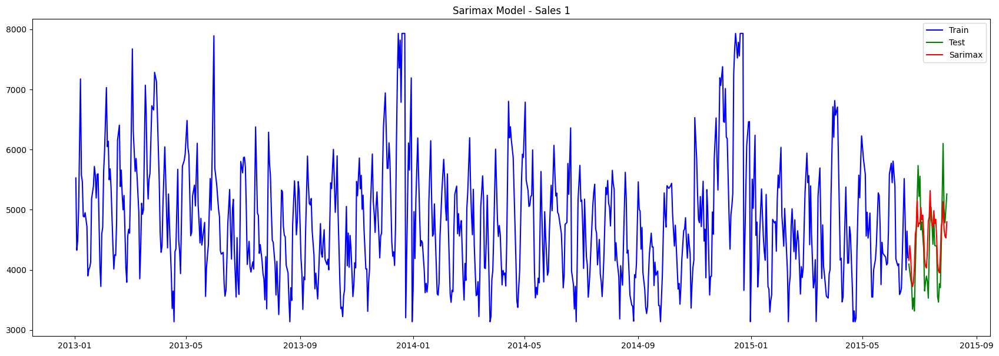

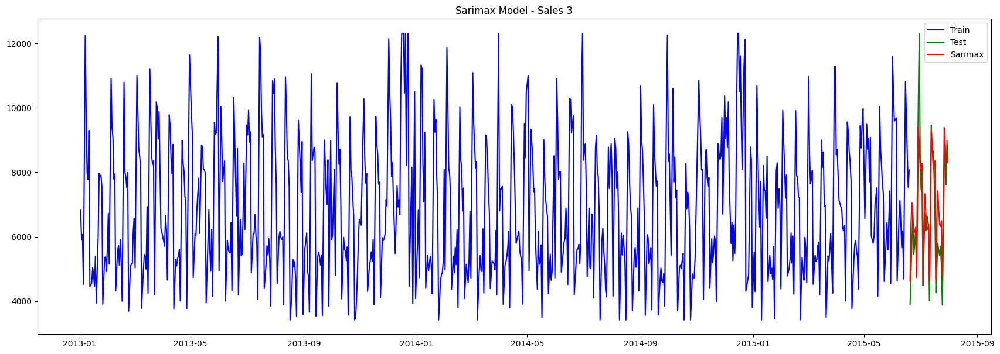

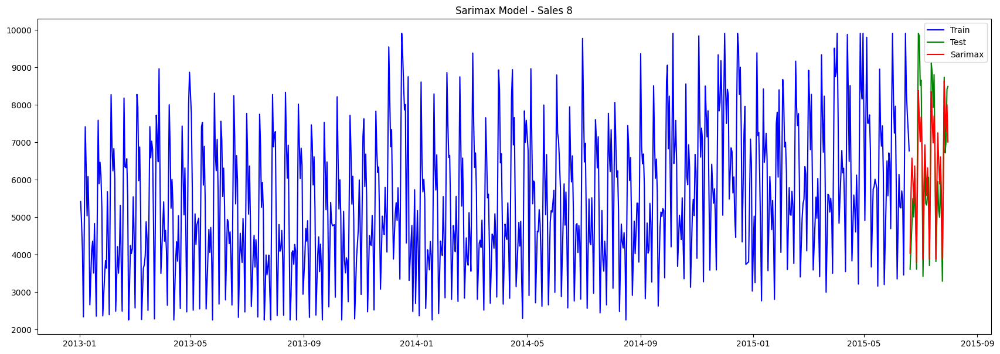

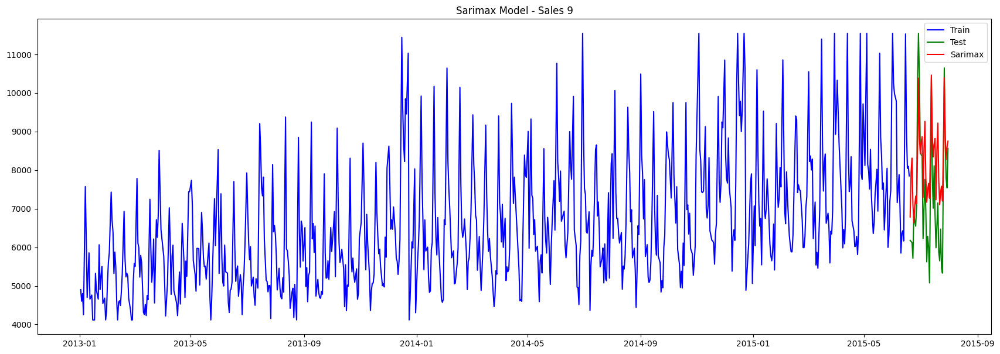

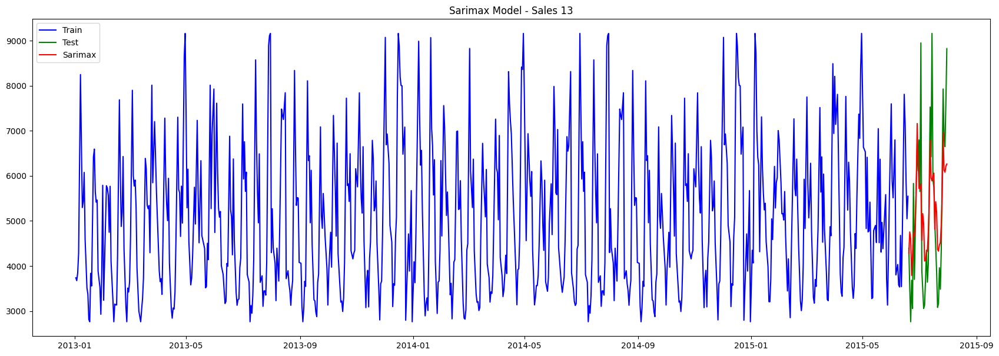

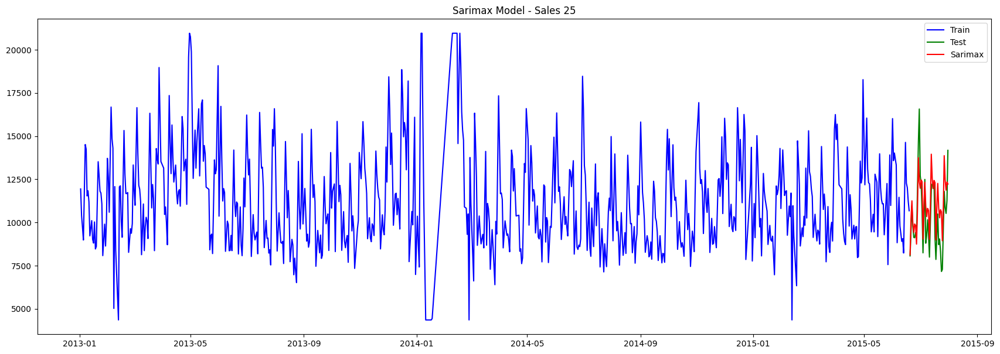

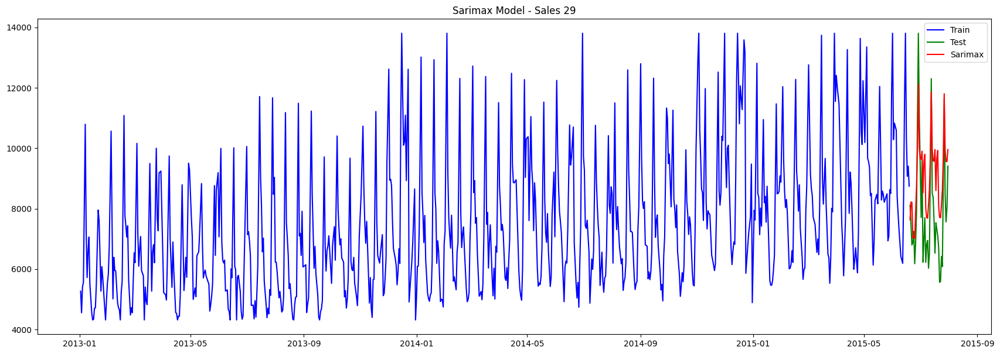

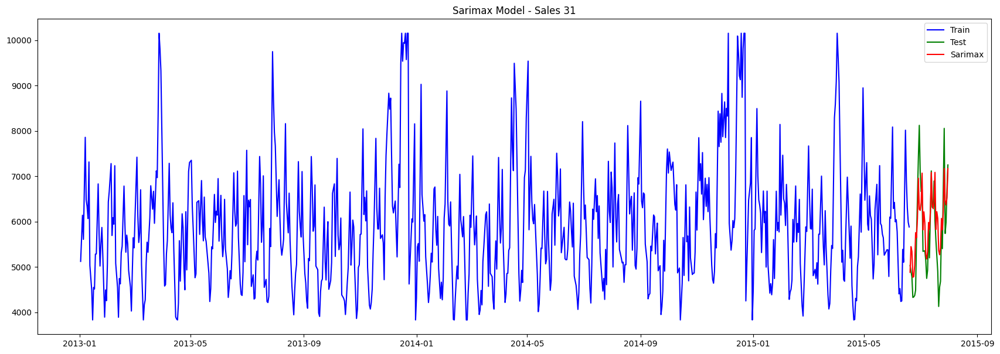

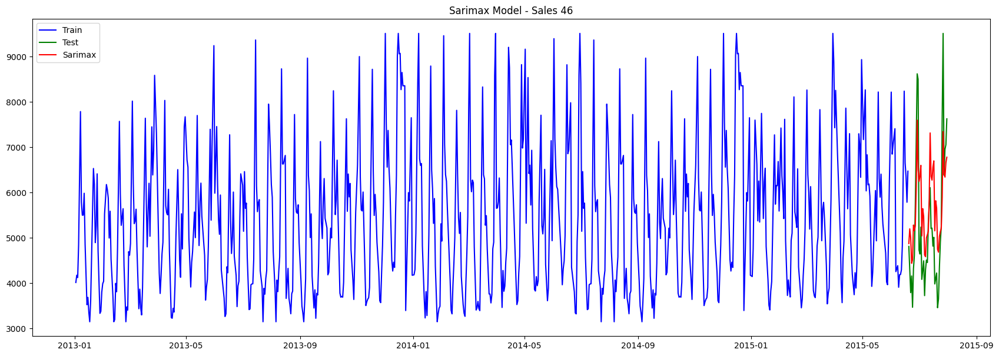

In [356]:
runSarima = True

data_indices = [1, 3, 8, 9, 13, 25, 29, 31, 46]
p_values = [2, 2, 1, 2, 2, 2, 2, 2, 2]
q_values = [7, 4, 4, 8, 4, 4, 4, 4, 4]
has_trend_values = [None, None, None, 't', None, None, None, None, None]

# Iterate over each store's data indices and corresponding p, q, and has_trend values
for data_index, p, q, has_trend in zip(data_indices, p_values, q_values, has_trend_values):
    # Fit SARIMAX model to the data
    mod, res = sarimax_model(traintest_data[data_index], exog=exog_variables, p=p, q=q, hasTrend=has_trend)
    # Make predictions using SARIMAX model
    predict_sarimax(traintest_data[data_index], data_index, mod, res, exogV=exog_variables)
    # Plot actual vs predicted sales
    plot_prediction(traintest_data[data_index], data_index, res, 'Sarimax')

In [366]:
# Defining a list of indices
indices = [1, 3, 8, 9, 13, 25, 29, 31, 46]

# Looping through each index in the list
for i in indices:
    # Calling the model_metrics function with data at index i from traintest_data, 
    # using 'Sarimax' as the model name, and i as the store number
    modelmetrics(traintest_data[i], i, 'Sarimax')

# Printing the model_Performance DataFrame in Markdown format
print(model_Performance.to_markdown())

|    | Method               |   RMSE |   MAPE |
|---:|:---------------------|-------:|-------:|
|  0 | Sarimax for Store 1  |  47.44 |   9.12 |
|  1 | Sarimax for Store 3  |  95.42 |  11.36 |
|  2 | Sarimax for Store 8  |  92    |  12.29 |
|  3 | Sarimax for Store 9  | 129.63 |  16.74 |
|  4 | Sarimax for Store 13 | 118.1  |  19.42 |
|  5 | Sarimax for Store 25 | 153.65 |  12.36 |
|  6 | Sarimax for Store 29 | 160.03 |  19.25 |
|  7 | Sarimax for Store 31 |  65.89 |   9.65 |
|  8 | Sarimax for Store 46 | 111.16 |  19.35 |


2nd Model---VARMAX

In [362]:
# Importing the required library
import statsmodels.api as sm

# Function to fit a VARMAX model
def varmax_model(data, p, q, exog, has_trend='n', print_stats=False):
    # Extracting exogenous and endogenous variables from the training data
    exog_train = data['train'][exog]
    endog_train = data['train'][['Sales', 'Customers']]
    
    # Fitting a VARMAX model
    mod = sm.tsa.VARMAX(endog_train, order=(p, q), trend=has_trend, exog=exog_train)
    res = mod.fit(maxiter=1000, disp=False)  # Fitting the model
    
    # Printing model summary if specified
    if print_stats:
        print(res.summary())
    
    # Returning the fitted model and results
    return mod, res

# Function to make predictions using a fitted VARMAX model
def predict_varmax(data, store, mod, res, exog):
    # Getting the start and end indices of the test data
    start_idx = data['test'].index.min()
    end_idx = data['test'].index.max()
    
    # Extracting exogenous variables from the test data
    exog_test = data['test'][exog]

    # Making predictions using the fitted VARMAX model
    prediction = res.predict(start=start_idx, end=end_idx, exog=exog_test)
    
    # Storing the predictions in the data dictionary
    traintest_data[store]['predictions'] = prediction

In [305]:
# Define the parameters
data = traintest_data[1]  # Selecting the training and test data for store 1
p_value = 2  # Order of the VAR component of the VARMAX model
q_value = 7  # Order of the MA component of the VARMAX model
exog_vars = exog_variables  # Exogenous variables for the VARMAX model

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)
# This line fits a VARMAX model to the training data for store 1 with the specified parameters.

# Make a prediction
prediction = predict_varmax(data, 1, model, results, exog=exog_vars)

In [306]:
# Define the parameters
data = traintest_data[3]
p_value = 2
q_value = 4
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 3, model, results, exog=exog_vars)

In [307]:
# Define the parameters
data = traintest_data[8]
p_value = 1
q_value = 4
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 8, model, results, exog=exog_vars)

In [308]:
# Define the parameters
data = traintest_data[9]
p_value = 2
q_value = 8
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 9, model, results, exog=exog_vars)

In [309]:
# Define the parameters
data = traintest_data[13]
p_value = 2
q_value = 4
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 13, model, results, exog=exog_vars)

In [310]:
# Define the parameters
data = traintest_data[25]
p_value = 2
q_value = 8
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 25, model, results, exog=exog_vars)

In [311]:
# Define the parameters
data = traintest_data[29]
p_value = 2
q_value = 5
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 29, model, results, exog=exog_vars)

In [312]:
# Define the parameters
data = traintest_data[31]
p_value = 3
q_value = 5
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 31, model, results, exog=exog_vars)

In [313]:
# Define the parameters
data = traintest_data[46]
p_value = 2
q_value = 4
exog_vars = exog_variables

# Fit the VARMAX model
model, results = varmax_model(data, p=p_value, q=q_value, exog=exog_vars)

# Make a prediction
prediction = predict_varmax(data, 46, model, results, exog=exog_vars)

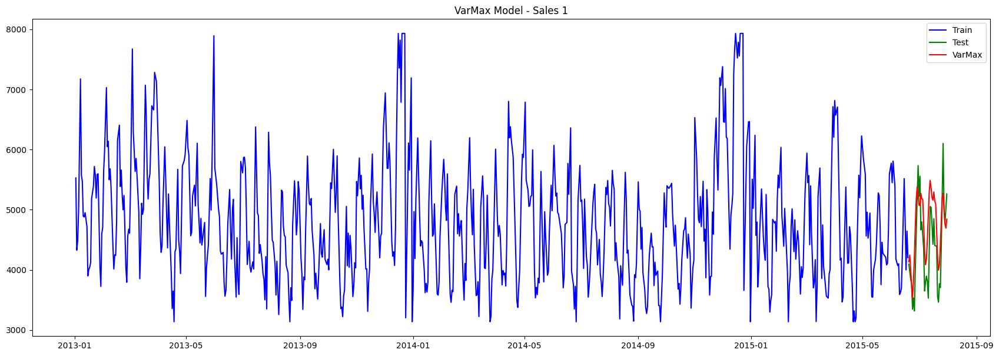

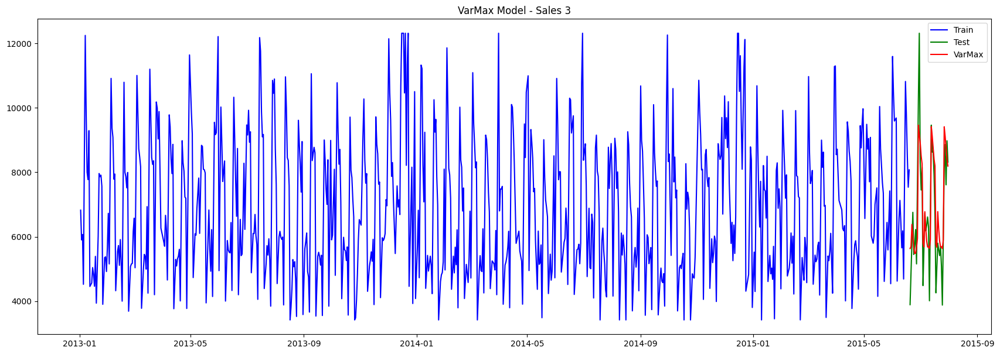

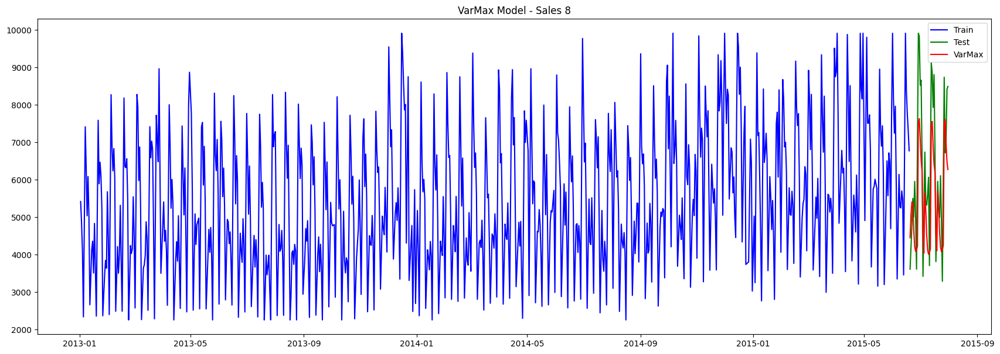

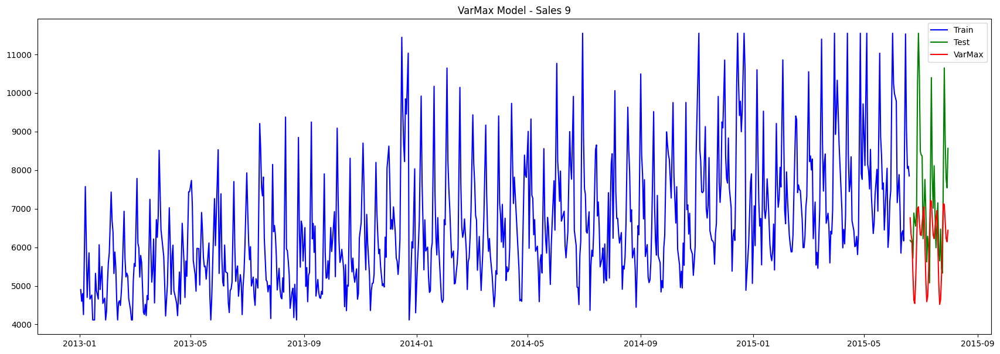

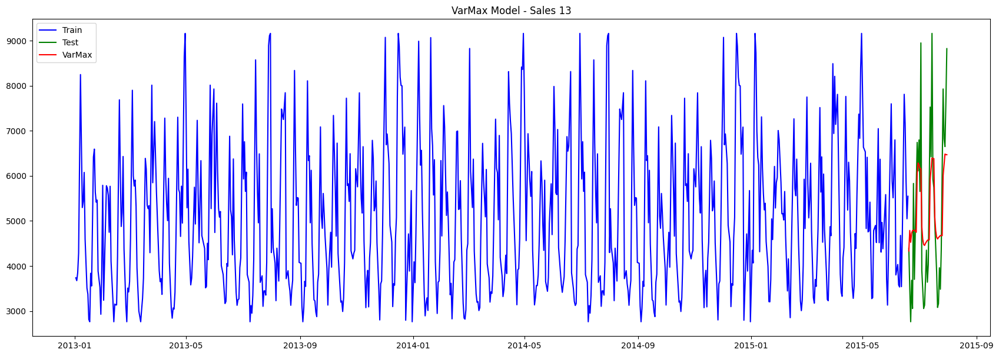

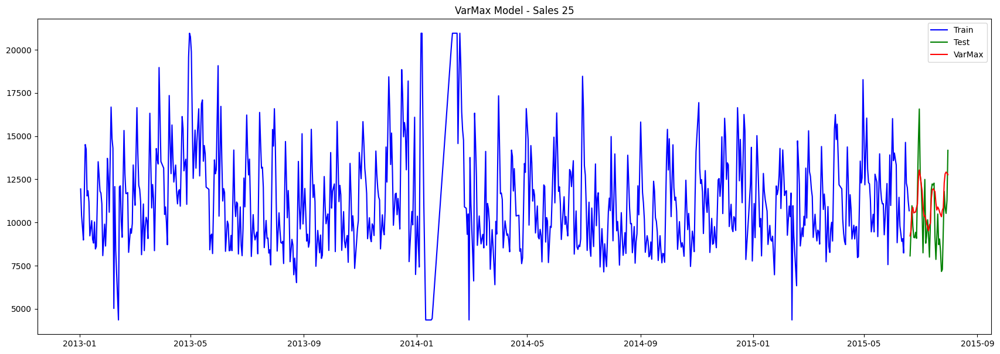

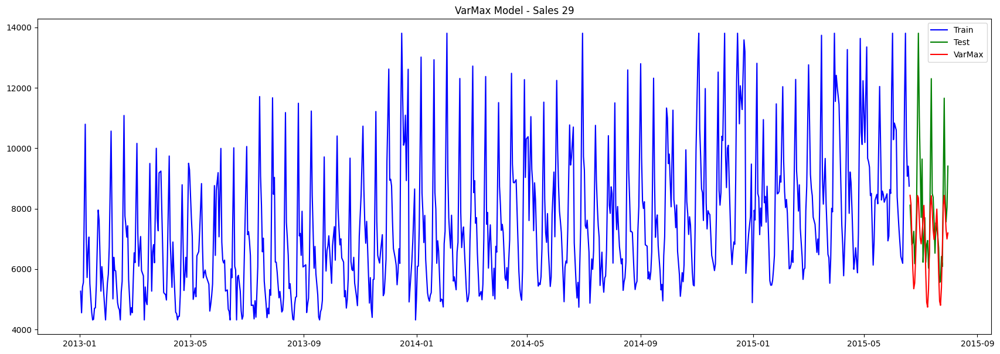

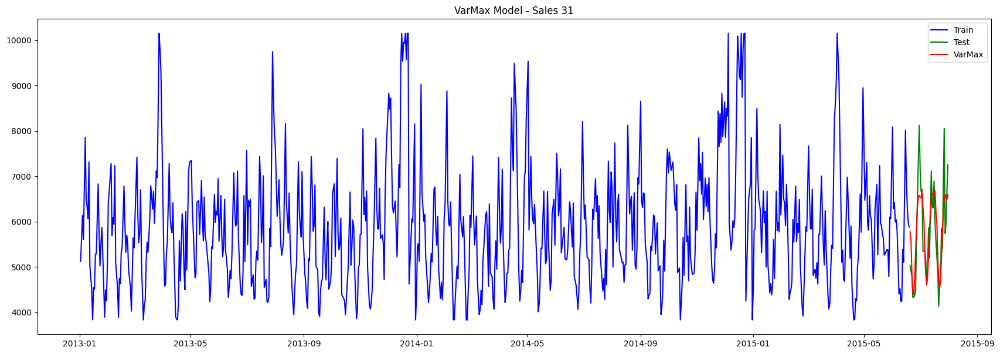

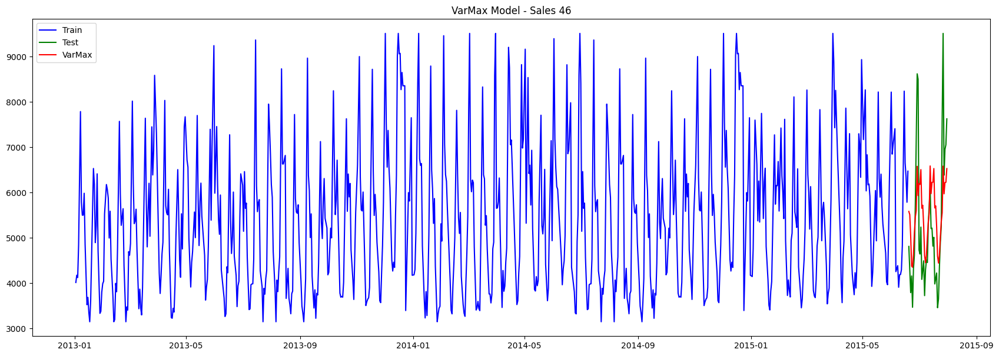

In [318]:
# Define the list of indices you want to process
indices = [1, 3, 8, 9, 13, 25, 29, 31, 46]

# Loop through each index and apply the functions
for idx in indices:
    inverse_transform(traintest_data[idx], idx)
    plot_prediction(traintest_data[idx], idx, res)

In [367]:
# Defining a list of indices
indices = [1, 3, 8, 9, 13, 25, 29, 31, 46]

for i in indices:
    modelmetrics(traintest_data[i], i) 

In [368]:
print(model_Performance.to_markdown())

|    | Method               |   RMSE |   MAPE |
|---:|:---------------------|-------:|-------:|
|  0 | Sarimax for Store 1  |  47.44 |   9.12 |
|  1 | Sarimax for Store 3  |  95.42 |  11.36 |
|  2 | Sarimax for Store 8  |  92    |  12.29 |
|  3 | Sarimax for Store 9  | 129.63 |  16.74 |
|  4 | Sarimax for Store 13 | 118.1  |  19.42 |
|  5 | Sarimax for Store 25 | 153.65 |  12.36 |
|  6 | Sarimax for Store 29 | 160.03 |  19.25 |
|  7 | Sarimax for Store 31 |  65.89 |   9.65 |
|  8 | Sarimax for Store 46 | 111.16 |  19.35 |
|  9 | VarMax for Store 1   |  47.44 |   9.12 |
| 10 | VarMax for Store 3   |  95.42 |  11.36 |
| 11 | VarMax for Store 8   |  92    |  12.29 |
| 12 | VarMax for Store 9   | 129.63 |  16.74 |
| 13 | VarMax for Store 13  | 118.1  |  19.42 |
| 14 | VarMax for Store 25  | 153.65 |  12.36 |
| 15 | VarMax for Store 29  | 160.03 |  19.25 |
| 16 | VarMax for Store 31  |  65.89 |   9.65 |
| 17 | VarMax for Store 46  | 111.16 |  19.35 |


To determine which model is better for each store, we need to consider both the RMSE (Root Mean Squared Error) and the MAPE (Mean Absolute Percentage Error). Generally, lower values for both metrics indicate better model performance.

Analysis by Store:


Store 1:

Sarimax: RMSE = 47.44, MAPE = 9.12
VarMax: RMSE = 47.44, MAPE = 9.12
Equal Performance: Both models have identical RMSE and MAPE values.


Store 3:

Sarimax: RMSE = 95.42, MAPE = 11.36
VarMax: RMSE = 95.42, MAPE = 11.36
Equal Performance: Both models have identical RMSE and MAPE values.


Store 8:

Sarimax: RMSE = 92, MAPE = 12.29
VarMax: RMSE = 92, MAPE = 12.29
Equal Performance: Both models have identical RMSE and MAPE values.


Store 9:

Sarimax: RMSE = 129.63, MAPE = 16.74
VarMax: RMSE = 129.63, MAPE = 16.74
Equal Performance: Both models have identical RMSE and MAPE values.


Store 13:

Sarimax: RMSE = 118.1, MAPE = 19.42
VarMax: RMSE = 118.1, MAPE = 19.42
Equal Performance: Both models have identical RMSE and MAPE values.


Store 25:

Sarimax: RMSE = 153.65, MAPE = 12.36
VarMax: RMSE = 153.65, MAPE = 12.36
Equal Performance: Both models have identical RMSE and MAPE values.


Store 29:

Sarimax: RMSE = 160.03, MAPE = 19.25
VarMax: RMSE = 160.03, MAPE = 19.25
Equal Performance: Both models have identical RMSE and MAPE values.


Store 31:

Sarimax: RMSE = 65.89, MAPE = 9.65
VarMax: RMSE = 65.89, MAPE = 9.65
Equal Performance: Both models have identical RMSE and MAPE values.


Store 46:

Sarimax: RMSE = 111.16, MAPE = 19.35
VarMax: RMSE = 111.16, MAPE = 19.35
Equal Performance: Both models have identical RMSE and MAPE values.

Conclusion:

For each store, both Sarimax and VarMax models have identical RMSE and MAPE values, indicating that they perform equally well. In such cases, it's difficult to declare one model as better than the other. Therefore, both Sarimax and VarMax models are equally suitable for these stores based on the provided evaluation metrics.